# <ins> Finalizing the boundary-setting </ins>
Based on the last three models, we managed to obtain a pretty solid mapping of the areas of Eindhoven which could properly fit the definitions provided by Fieke.
It is crucial now to define these boundaries as accurately as possible; the goal of this notebook is thus to see how we can overlay Alex and Sjoerd's findings to the current mappings, and extract a more detailed map with clearly defined boundaries.


## Overlaying the maps
First, as I mentioned, we need to overlay the final mapping of Eindhoven that I designed to the mapping provided by Alex and Sjoerd; this will give us the most accurate mapping of the zones we will be working with, and will allow us to properly model the points of connection we want to place later on.

Analyzing the map the Built Environment guys provided, you can see that **all of the regions fit inside the boundary-passing model zones!** This means that what we need to do at this point is to merge and fit the specific OSM boundaries we will use to these distinctions, and create a workable map where all of the regions are split in this manner. The most accurate manner of doing this would be to manually extract the polygons using GeoJSON or by using QGIS and referencing the two maps; I opted to use the first approach, since we then can easily re-shape the neighborhoods if new data is provided.

You can see the file containing these boundaries **refinedMap.geojson** in the same directory as this Python notebook; after loading using folium and geopandas, it looks as follows:




In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import osmnx as ox
import json
import folium
from IPython.display import display, HTML

with open("refinedMap.geojson") as openedFile:
    polygonGeoJSON = json.load(openedFile)

# Convert GeoJSON to GeoDataFrame
geoDataEindhoven = gpd.GeoDataFrame.from_features(polygonGeoJSON["features"])
polygon = geoDataEindhoven.geometry.values[0]

# Create a Folium map centered on Eindhoven
eindhoven_map = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")

# Add the GeoJSON data to the map
folium.GeoJson(
    polygonGeoJSON,
    name="Eindhoven Boundaries",
    style_function=lambda feature: {
        "fillColor": "blue",
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.5,
    },
).add_to(eindhoven_map)
display(HTML(eindhoven_map._repr_html_()))

Now, we convert the GeoJSON data that I plotted into a working polygon, so that we may use it with OSMNx for optimal point plotting.

In [6]:
with open("refinedMap.geojson") as openedFile:
    polygonGeoJSON = json.load(openedFile)
    
geoDataEindhoven = gpd.GeoDataFrame.from_features(polygonGeoJSON["features"])
polygon = geoDataEindhoven.geometry.values[0]


Everything's converted - we can move on to finding the points we will use for our hubs.

## Finding low-efficiency zones

I am still brainstorming if there is a better way of going about this, but for now, the best approach would be to do what we presented in the midterm presentation: highlighting low-scoring zones in terms of 15-minute walkability, and then further refining where within these zones it would be best to place the bikes.

In [7]:
from shapely.geometry import Point, Polygon
import numpy as npo
import folium

with open("refinedMap.geojson") as openedFile:
    polygonGeoJSON = json.load(openedFile)

geoDataEindhoven = gpd.GeoDataFrame.from_features(polygonGeoJSON["features"])
polygons = geoDataEindhoven.geometry

# I use the same tags I used before, since we agreed on them as a form of baseline, and the map Sjoerd showed used very
# similar tags. I added a few things to the "leisure" and "shop" tags because I realized that they are not as varied
# as the "office" and "amenity" tags. 

tags = {
    'office': ['yes'],  # All workplaces, since OSM has an incredible amount of identifiers.
    'shop': ['supermarket', 'convenience', 'bakery', 'greengrocer', 'butcher'],
    'amenity': [
        'pharmacy', 'hospital', 'clinic', 'doctors', 
        'school', 'kindergarten', 'college', 'university',  
        'cafe', 'restaurant', 'bar', 'cinema', 'theatre',  
        'community_centre', 'library', 'bicycle_rental',
        'place_of_worship'
        # Place of worship can be considered "key" ammenity for some, so should be included.
    ],
    'leisure': [
        'park', 'fitness_centre', 'sports_centre', 'stadium', 
        'dog_park', 'pitch', 'swimming_pool', 'playground',
        'nature_reserve'
    ],
    'shop' : [
        'supermarket', 'convenience', 'bakery', 'greengrocer', 'butcher',
        'department_store', 'general', 'cosmetics', 'stationery'
    ]
}

# First, we generate a grid of poinst so that this may actually be treated as a graphing problem.
def generateGrid(polygon, spacing=0.0015):
    minx, miny, maxx, maxy = polygon.bounds
    x_coords = npo.arange(minx, maxx, spacing)
    y_coords = npo.arange(miny, maxy, spacing)
    points = [Point(x,y) for x in x_coords for y in y_coords if polygon.contains(Point(x,y))]
    return points

# Then, we may simply analyze the polygons the same way we did way back in the original simulations,
# and give each polygon a score according to its accessibility.
lowScoreZones = []
for polygon in polygons:
    # As usual, needs some debugging messages
    print("Processing a new polygon... as always, might take a while.")
    
    # Generate a grid of points within the polygon - this is based on size of polygon, so 
    # there are obviously more points in larger polygons. Smallest ones has ~15, largest ~67
    grid_points = generateGrid(polygon)
    print(f"Generated {len(grid_points)} grid points within the polygon.")
    
    # Query OSM for the specified tags
    amenities = ox.features_from_polygon(polygon, tags)
    print(f"Found {len(amenities)} amenities in the polygon.")
    
    # Check accessibility for each grid point
    lowScoringPoints = []
    amenityCountsPer = []
    
    for point in grid_points:
        # Create a 15-minute walking isochrone (approximately 1.2 km radius)
        isochrone = point.buffer(0.012)  # 1.2 km in degrees
        
        # Check if the isochrone contains any amenities
        accessible_amenities = amenities[amenities.intersects(isochrone)]
        amenityCount = len(accessible_amenities)
        amenityCountsPer.append(amenityCount)
        
    # The rubric used by CityAccessMap scores the "Average" zones to be below 50% of the max;
    # here, I use 30%.
    maxAm = max(amenityCountsPer) if amenityCountsPer else 0
    threshold = maxAm * 0.5
    
    for point, count in zip(grid_points, amenityCountsPer):
        if count < threshold:
            lowScoringPoints.append(point)
    
    print(f"Identified {len(lowScoringPoints)} low-scoring points in the polygon.")
    lowScoreZones.append(gpd.GeoDataFrame(geometry=lowScoringPoints))
    
# Now, we need to visualize this! 
# We do what we did earlier, and convert to a single GeoDataFrame.
lowScoreZonesGDF = gpd.GeoDataFrame(pd.concat(lowScoreZones, ignore_index=True))
eindhoven_map = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")

# Add the low-scoring points to the map
for _, row in lowScoreZonesGDF.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=4,  # Slightly larger radius for low-scoring points
        color="red",  # Red color for low-scoring points
        fill=True,
        fill_opacity=0.8,
    ).add_to(eindhoven_map)

# Add the generated grid points to the map
for polygon in polygons:
    # Generate a grid of points within the polygon
    grid_points = generateGrid(polygon)
    
    # Add each grid point to the map
    for point in grid_points:
        folium.CircleMarker(
            location=[point.y, point.x],
            radius=2,  # Smaller radius for grid points
            color="green",  # Green color for grid points
            fill=True,
            fill_opacity=0.6,
        ).add_to(eindhoven_map)

# Query OSM for bus stops within the Eindhoven boundary
bus_stop_tag = {'highway': 'bus_stop'}
bus_stops = ox.features_from_polygon(polygons.unary_union, bus_stop_tag)  # Combine all polygons into one

# Debugging: Print the number of bus stops found
print(f"Found {len(bus_stops)} bus stops in Eindhoven.")

# Add bus stops to the map
for _, bus_stop in bus_stops.iterrows():
    if bus_stop.geometry.geom_type == 'Point':  # Ensure the geometry is a point
        folium.CircleMarker(
            location=[bus_stop.geometry.y, bus_stop.geometry.x],
            radius=3,  # Smaller radius for bus stops
            color="blue",  # Blue color for bus stops
            fill=True,
            fill_opacity=0.8,
            tooltip="Bus Stop",  # Optional: Add a tooltip
        ).add_to(eindhoven_map)

# Add the original polygons
folium.GeoJson(
    polygonGeoJSON,
    name="Eindhoven Boundaries",
    style_function=lambda feature: {
        "fillColor": "blue",
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.2,
    },
).add_to(eindhoven_map)

# Save the map (for sharing)
output_file = "eindhoven_map_with_bus_stops.html"
eindhoven_map.save(output_file)
print(f'Map saved to {output_file}')

# Display the map
eindhoven_map

Processing a new polygon... as always, might take a while.
Generated 640 grid points within the polygon.
Found 358 amenities in the polygon.
Identified 198 low-scoring points in the polygon.
Processing a new polygon... as always, might take a while.
Generated 499 grid points within the polygon.
Found 572 amenities in the polygon.
Identified 283 low-scoring points in the polygon.
Processing a new polygon... as always, might take a while.
Generated 229 grid points within the polygon.
Found 103 amenities in the polygon.
Identified 32 low-scoring points in the polygon.
Processing a new polygon... as always, might take a while.
Generated 254 grid points within the polygon.
Found 172 amenities in the polygon.
Identified 27 low-scoring points in the polygon.
Processing a new polygon... as always, might take a while.
Generated 183 grid points within the polygon.
Found 68 amenities in the polygon.
Identified 31 low-scoring points in the polygon.


C:\Users\euseb\AppData\Local\Temp\ipykernel_26012\464915959.py:118: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  bus_stops = ox.features_from_polygon(polygons.unary_union, bus_stop_tag)  # Combine all polygons into one


Found 275 bus stops in Eindhoven.
Map saved to eindhoven_map_with_bus_stops.html


## Mapping the improvement zones.
Looking at the map displayed above, we can see clearly see a number of zones which acommodate access to fewer services than is the average for the rest of the city. We specifically use this criterium for measurement, since we have already checked for 15-minute accessibility, alongside optimal population density and service diversity; the goal now is to "even out" these zones which do not adhere to a city-wide standard of mobility.

Sjoerd and Alex found a number of suitable locations which may be used for the placement of mobility hubs around the city. I overlaid these maps to obtain a provisional selection, manually mapping the potential zones of placement in accordance with existing infrastructure that I found on Google Maps. Some explanations are in order to fully explain the mapping of these locations:

1) To make our project future-proof, we decided to plan with the transformations to the Eindhoven Station Area in mind, specifically adhering to the planned modifications to the Eindhoven Central station as planned by KCAP. Although the placement of the hub in a zone of high-mobility may initially seem counterintuitive, after deliberation we have concluded that such an incusion would seamlessly integrate with the existing transport infrastructure and allow for further access to other mobility hubs.

2) The specific placement of the hubs as *physical* spaces is done as follows:
- Where possible 
- Where possible, the zones are incorporated into preexisting infrastructure, replacing vacant lots where possible, and where this is impossible, being composed into existing car-centric infrastructure, such as parking lots.
- If the above is not possible, the zones are extended to give planners an array of potential locations which can still be modeled appropriately

    In general, the zones are mapped in a manner such that they can be abstracted to a single point consistent with the grid used for previous mapping.

Some more comments regarding specific zones:
1) Mercuriuslaan zone: fitted into a pre-existing green space.
2) Catharina Ziekhuis / Maxima Medisch Centrum / Anna Ziekhuis: accessibility of the disabled
3) Catharina Ziekhuis: big transit point.
3) Next to Stroomz de Akkers: playground
4) Lavendelstraat: tight area with slight expansion and green zone.
5) Solmsweg: vacant lot between two apartment blocks; cant use other one

You may see the zones in the Folium map provided below: they are highlighted in a XXX color so that they may be more distinctly recognized. In the next step, we will try to see how these may improve communication to acquire an estimate of their sustainability.

In [8]:
with open("hubLocations.geojson") as hubMapFile:
    hubPolygon = json.load(hubMapFile)

# As with the full Eindhoven map, we convert the GeoJSON to a GeoDataFrame:
hubGeoDataFrame = gpd.GeoDataFrame.from_features(hubPolygon["features"])
polygon = hubGeoDataFrame.geometry.values[0]

# Create a Folium map centered on the hub locations drawn in GeoJSON:
hubMapEindhoven = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")

# We want to highlight the placements of the mobility hubs, so we specify their coordinate points as
# geojson features. This was A PAIN to write down, since gejson formatting is finicky.
hubCoordinates = [
    [
        [5.479242878818951, 51.44325775636963],
        [5.4776044181902535, 51.443029567735266],
        [5.478054544736551, 51.44202702055455],
        [5.479500951372074, 51.442210323735026],
        [5.479242878818951, 51.44325775636963]
    ],
    [
        [5.4705474804922005, 51.46453387794932],
        [5.4705542616922, 51.46434165458419],
        [5.471249334683762, 51.464352216328365],
        [5.471235772283819, 51.4644599459815],
        [5.473435691022786, 51.46451142198288],
        [5.473427854871261, 51.464868533654055],
        [5.47064438961209, 51.46480740637557],
        [5.470659881996994, 51.46454037572332],
        [5.4705474804922005, 51.46453387794932]
    ],
    [
        [5.4909987501103785, 51.47036299334738],
        [5.490919511068853, 51.46992304756114],
        [5.491994405882707, 51.469843642259804],
        [5.4920529738699315, 51.47017628516602],
        [5.492080535274624, 51.4702921730929],
        [5.4909987501103785, 51.47036299334738]
    ],
    [
        [5.488958986867033, 51.454195789565574],
        [5.488928429428, 51.453770525969844],
        [5.489634645789067, 51.45373455822033],
        [5.4896719937700595, 51.454187326647],
        [5.489675389041054, 51.45432696460165],
        [5.489230608544062, 51.45433754321695],
        [5.489217027460029, 51.45420848394019],
        [5.488958986867033, 51.454195789565574]
    ],
    [
        [5.474621202205924, 51.47619067373631],
        [5.474591931246323, 51.4758989748988],
        [5.475477377799393, 51.475871628037254],
        [5.475506648758994, 51.476181558175796],
        [5.474621202205924, 51.47619067373631]
    ],
    [
        [5.520386704860698, 51.439007813779085],
        [5.519824170435442, 51.438839165418216],
        [5.519984894556927, 51.438605394382506],
        [5.5204617094507, 51.43868554458689],
        [5.520560822659149, 51.438752336315815],
        [5.520386704860698, 51.439007813779085]
    ],
    [
        [5.488345696419913, 51.420028453490715],
        [5.488251180343866, 51.419494880781485],
        [5.490116629225724, 51.41935218004775],
        [5.4902260688930085, 51.41989506089749],
        [5.489972367845638, 51.41999432984127],
        [5.488644168240938, 51.42009670071329],
        [5.488345696419913, 51.420028453490715]
    ],
    [
        [5.501149290906795, 51.4223639138599],
        [5.5009076675460165, 51.42221998989163],
        [5.501679419772273, 51.42169151518314],
        [5.502678370083771, 51.42225597092616],
        [5.50241510881105, 51.42239989478114],
        [5.501765971424646, 51.42195912654381],
        [5.501149290906795, 51.4223639138599]
    ],
    [
        [5.460946434395254, 51.43035395528261],
        [5.4604985090147125, 51.42993147397817],
        [5.461210595517542, 51.42960207906458],
        [5.461662349320193, 51.42941828521862],
        [5.462412720042806, 51.430081849127504],
        [5.462064333635595, 51.43021074171892],
        [5.461788687248202, 51.429991146715935],
        [5.460946434395254, 51.43035395528261]
    ],
    [
        [5.444885035992172, 51.42007169912026],
        [5.44524278164252, 51.41910093602877],
        [5.4476986571833095, 51.420324938274774],
        [5.447398924341599, 51.4205480287485],
        [5.446345024994912, 51.42024052537914],
        [5.44554251448281, 51.42013802379617],
        [5.444885035992172, 51.42007169912026]
    ]
]

# Method for checking if a feature is a mobility hub zone:
# used later in the Folium map to style the hub locations.
def isHub(feature):
    coordinates = feature["geometry"]["coordinates"][0]
    return coordinates in hubCoordinates

# Add the hub locations to the map
folium.GeoJson(
    hubPolygon,
    name="Hub Locations",
    style_function=lambda feature: {
        "fillColor": "red" if isHub(feature) else "blue", 
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.5 if isHub(feature) else 0.2,
    },
).add_to(hubMapEindhoven)
display(HTML(hubMapEindhoven._repr_html_()))

## Measuring improvement and eliminating inefficiencies
Our goal in this part of the modelling assignment is to adjust the placement of the zones such that the efficiency of their placement is maximal. We thus need to define two things for the process of elimination that is to follow: the scoring method and the goal.

1) **Scoring method**: in our development of the original map, we measured the suitability of a point on the overlaid grid to fit a 15-minute city by measuring its adherence to the walkability-standard of the city (as measured by the density of services.) To align with this, we make each mobility hub zone an "upgrade" to the grid it overlays: each point within the 15-minute walking radius of a hub has its "accessibility" radius expanded by the size that can be covered within 15 minutes by biking (minus the time spent walking.) This allows for a solid model of how each zone improves the area around it (though one still recquiring solid simulation)

2) **Goal**: as the name of the category implies, this is an "elimination process": after running the model, we will highlight the zones which improve accessibility by the highest margin (as measured by the overall increase in service density from the points affected by the hub placement), and extract them for our later simulation.

We begin by first overlaying the grid onto the map, as we did during our primary simulation:

In [9]:
# Load Eindhoven polygon GeoJSON
with open("refinedMap.geojson") as openedFile:
    polygonGeoJSON = json.load(openedFile)

geoDataEindhoven = gpd.GeoDataFrame.from_features(polygonGeoJSON["features"])
polygons = geoDataEindhoven.geometry

# Weird Jupyter notebook issue: I can reuse tags no problem, same with a number of variables,
# but if I try to reuse the hubCoordinates variable, it only uses a selection of them.
# So, I just copy-paste the hub coordinates here again.

hubCoordinates = [
    [
        [5.479242878818951, 51.44325775636963],
        [5.4776044181902535, 51.443029567735266],
        [5.478054544736551, 51.44202702055455],
        [5.479500951372074, 51.442210323735026],
        [5.479242878818951, 51.44325775636963]
    ],
    [
        [5.4705474804922005, 51.46453387794932],
        [5.4705542616922, 51.46434165458419],
        [5.471249334683762, 51.464352216328365],
        [5.471235772283819, 51.4644599459815],
        [5.473435691022786, 51.46451142198288],
        [5.473427854871261, 51.464868533654055],
        [5.47064438961209, 51.46480740637557],
        [5.470659881996994, 51.46454037572332],
        [5.4705474804922005, 51.46453387794932]
    ],
    [
        [5.4909987501103785, 51.47036299334738],
        [5.490919511068853, 51.46992304756114],
        [5.491994405882707, 51.469843642259804],
        [5.4920529738699315, 51.47017628516602],
        [5.492080535274624, 51.4702921730929],
        [5.4909987501103785, 51.47036299334738]
    ],
    [
        [5.488958986867033, 51.454195789565574],
        [5.488928429428, 51.453770525969844],
        [5.489634645789067, 51.45373455822033],
        [5.4896719937700595, 51.454187326647],
        [5.489675389041054, 51.45432696460165],
        [5.489230608544062, 51.45433754321695],
        [5.489217027460029, 51.45420848394019],
        [5.488958986867033, 51.454195789565574]
    ],
    [
        [5.474621202205924, 51.47619067373631],
        [5.474591931246323, 51.4758989748988],
        [5.475477377799393, 51.475871628037254],
        [5.475506648758994, 51.476181558175796],
        [5.474621202205924, 51.47619067373631]
    ],
    [
        [5.520386704860698, 51.439007813779085],
        [5.519824170435442, 51.438839165418216],
        [5.519984894556927, 51.438605394382506],
        [5.5204617094507, 51.43868554458689],
        [5.520560822659149, 51.438752336315815],
        [5.520386704860698, 51.439007813779085]
    ],
    [
        [5.488345696419913, 51.420028453490715],
        [5.488251180343866, 51.419494880781485],
        [5.490116629225724, 51.41935218004775],
        [5.4902260688930085, 51.41989506089749],
        [5.489972367845638, 51.41999432984127],
        [5.488644168240938, 51.42009670071329],
        [5.488345696419913, 51.420028453490715]
    ],
    [
        [5.501149290906795, 51.4223639138599],
        [5.5009076675460165, 51.42221998989163],
        [5.501679419772273, 51.42169151518314],
        [5.502678370083771, 51.42225597092616],
        [5.50241510881105, 51.42239989478114],
        [5.501765971424646, 51.42195912654381],
        [5.501149290906795, 51.4223639138599]
    ],
    [
        [5.460946434395254, 51.43035395528261],
        [5.4604985090147125, 51.42993147397817],
        [5.461210595517542, 51.42960207906458],
        [5.461662349320193, 51.42941828521862],
        [5.462412720042806, 51.430081849127504],
        [5.462064333635595, 51.43021074171892],
        [5.461788687248202, 51.429991146715935],
        [5.460946434395254, 51.43035395528261]
    ],
    [
        [5.444885035992172, 51.42007169912026],
        [5.44524278164252, 51.41910093602877],
        [5.4476986571833095, 51.420324938274774],
        [5.447398924341599, 51.4205480287485],
        [5.446345024994912, 51.42024052537914],
        [5.44554251448281, 51.42013802379617],
        [5.444885035992172, 51.42007169912026]
    ]
]

# This is the crux of this entire modification - instead of measuring via point-to-point
# of the boundaries defined in hubCoordinates, we create a Polygon object for each hub.

hub_polygons = [Polygon(hub) for hub in hubCoordinates]

# Check proximity to any hub (using the centroid of the hub polygons)
# I don't know if I ever explained what a centroid is so - essentially, a geometrical feature's center of gravity.
def within_hub_proximity(point, hubs, threshold_m=500):
    threshold_deg = threshold_m / 111320  # Approximate conversion: 1 deg ≈ 111.32 km
    for hub in hubs:
        if point.distance(hub.centroid) <= threshold_deg:
            return True
    return False

# Main accessibility analysis
accessible_points = []
inaccessible_points = []

for polygon in polygons:
    grid_points = generateGrid(polygon)
    amenities = ox.features_from_polygon(polygon, tags)

    for point in grid_points:
        radius = 0.1 if within_hub_proximity(point, hub_polygons) else 0.012
        isochrone = point.buffer(radius)
        accessible_amenities = amenities[amenities.intersects(isochrone)]
        if len(accessible_amenities) >= 10:
            accessible_points.append(point)
        else:
            inaccessible_points.append(point)

# Convert lowScoreZones to a set for faster lookup
low_score_points = set(pt for zone in lowScoreZones for pt in zone.geometry)

# Visualization
eindhoven_map = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")

# Add polygons
folium.GeoJson(polygonGeoJSON).add_to(eindhoven_map)

# Add mobility hubs (red color)
for poly in hub_polygons:
    folium.Polygon(
        locations=[(pt[1], pt[0]) for pt in poly.exterior.coords],
        color='red', weight=2, fill=True, fill_opacity=0.3
    ).add_to(eindhoven_map)

# Add accessible (green) and inaccessible (red) points
for pt in accessible_points:
    # Check if the point was previously in lowScoreZones
    if pt in low_score_points:
        # Highlight improvement nodes in orange
        folium.CircleMarker(
            location=[pt.y, pt.x], radius=2, color="darkgreen", fill=True, fill_opacity=0.6
        ).add_to(eindhoven_map)
    else:
        # Regular accessible points in green
        folium.CircleMarker(
            location=[pt.y, pt.x], radius=2, color="green", fill=True, fill_opacity=0.6
        ).add_to(eindhoven_map)

# Add inaccessible points (still in lowScoreZones)
for pt in low_score_points:
    if pt not in accessible_points:  # Ensure these points are still inaccessible
        folium.CircleMarker(
            location=[pt.y, pt.x], radius=2, color="red", fill=True, fill_opacity=0.6
        ).add_to(eindhoven_map)

# Save the map
eindhoven_map


## Measuring improvement and eliminating inefficiencies
Our goal in this part of the modelling assignment is to adjust the placement of the zones such that the efficiency of their placement is maximal. We thus need to define two things for the process of elimination that is to follow: the scoring method and the goal.

1) **Scoring method**: in our development of the original map, we measured the suitability of a point on the overlaid grid to fit a 15-minute city by measuring its adherence to the walkability-standard of the city (as measured by the density of services.) To align with this, we make each mobility hub zone an "upgrade" to the grid it overlays: each point within the 15-minute walking radius of a hub has its "accessibility" radius expanded by the size that can be covered within 15 minutes by biking (minus the time spent walking.) This allows for a solid model of how each zone improves the area around it (though one still recquiring solid simulation)

2) **Goal**: as the name of the category implies, this is an "elimination process": after running the model, we will highlight the zones which improve accessibility by the highest margin (as measured by the overall increase in service density from the points affected by the hub placement), and extract them for our later simulation.

We begin by first overlaying the grid onto the map, as we did during our primary simulation:

In [10]:
# Load Eindhoven polygon GeoJSON
with open("refinedMap.geojson") as openedFile:
    polygonGeoJSON = json.load(openedFile)

geoDataEindhoven = gpd.GeoDataFrame.from_features(polygonGeoJSON["features"])
polygons = geoDataEindhoven.geometry

# Weird Jupyter notebook issue: I can reuse tags no problem, same with a number of variables,
# but if I try to reuse the hubCoordinates variable, it only uses a selection of them.
# So, I just copy-paste the hub coordinates here again.

hubCoordinates = [
    [
        [5.479242878818951, 51.44325775636963],
        [5.4776044181902535, 51.443029567735266],
        [5.478054544736551, 51.44202702055455],
        [5.479500951372074, 51.442210323735026],
        [5.479242878818951, 51.44325775636963]
    ],
    [
        [5.4705474804922005, 51.46453387794932],
        [5.4705542616922, 51.46434165458419],
        [5.471249334683762, 51.464352216328365],
        [5.471235772283819, 51.4644599459815],
        [5.473435691022786, 51.46451142198288],
        [5.473427854871261, 51.464868533654055],
        [5.47064438961209, 51.46480740637557],
        [5.470659881996994, 51.46454037572332],
        [5.4705474804922005, 51.46453387794932]
    ],
    # [
    #     [5.4909987501103785, 51.47036299334738],
    #     [5.490919511068853, 51.46992304756114],
    #     [5.491994405882707, 51.469843642259804],
    #     [5.4920529738699315, 51.47017628516602],
    #     [5.492080535274624, 51.4702921730929],
    #     [5.4909987501103785, 51.47036299334738]
    # ],
    # Catharina Hospital - kind of needed.
    [
        [5.488958986867033, 51.454195789565574],
        [5.488928429428, 51.453770525969844],
        [5.489634645789067, 51.45373455822033],
        [5.4896719937700595, 51.454187326647],
        [5.489675389041054, 51.45432696460165],
        [5.489230608544062, 51.45433754321695],
        [5.489217027460029, 51.45420848394019],
        [5.488958986867033, 51.454195789565574]
    ],
    [
        [5.474621202205924, 51.47619067373631],
        [5.474591931246323, 51.4758989748988],
        [5.475477377799393, 51.475871628037254],
        [5.475506648758994, 51.476181558175796],
        [5.474621202205924, 51.47619067373631]
    ],
    [
        [5.520386704860698, 51.439007813779085],
        [5.519824170435442, 51.438839165418216],
        [5.519984894556927, 51.438605394382506],
        [5.5204617094507, 51.43868554458689],
        [5.520560822659149, 51.438752336315815],
        [5.520386704860698, 51.439007813779085]
    ],
    [
        [5.488345696419913, 51.420028453490715],
        [5.488251180343866, 51.419494880781485],
        [5.490116629225724, 51.41935218004775],
        [5.4902260688930085, 51.41989506089749],
        [5.489972367845638, 51.41999432984127],
        [5.488644168240938, 51.42009670071329],
        [5.488345696419913, 51.420028453490715]
    ],
    # Small mobility hub squeezed in-between two tight roads - I'm very keen on removing this one.
    # [
    #     [5.501149290906795, 51.4223639138599],
    #     [5.5009076675460165, 51.42221998989163],
    #     [5.501679419772273, 51.42169151518314],
    #     [5.502678370083771, 51.42225597092616],
    #     [5.50241510881105, 51.42239989478114],
    #     [5.501765971424646, 51.42195912654381],
    #     [5.501149290906795, 51.4223639138599]
    # ],
    # Border mobility hub right next to the central district and on the edge of the southern one.
    # [
    #     [5.460946434395254, 51.43035395528261],
    #     [5.4604985090147125, 51.42993147397817],
    #     [5.461210595517542, 51.42960207906458],
    #     [5.461662349320193, 51.42941828521862],
    #     [5.462412720042806, 51.430081849127504],
    #     [5.462064333635595, 51.43021074171892],
    #     [5.461788687248202, 51.429991146715935],
    #     [5.460946434395254, 51.43035395528261]
    # ],
    # West-most Southern mobility hub  - central to that whole region, so I'm not keen on moving it.
    [
        [5.444885035992172, 51.42007169912026],
        [5.44524278164252, 51.41910093602877],
        [5.4476986571833095, 51.420324938274774],
        [5.447398924341599, 51.4205480287485],
        [5.446345024994912, 51.42024052537914],
        [5.44554251448281, 51.42013802379617],
        [5.444885035992172, 51.42007169912026]
    ]
]

# This is the crux of this entire modification - instead of measuring via point-to-point
# of the boundaries defined in hubCoordinates, we create a Polygon object for each hub.

hub_polygons = [Polygon(hub) for hub in hubCoordinates]

# Check proximity to any hub (using the centroid of the hub polygons)
# I don't know if I ever explained what a centroid is so - essentially, a geometrical feature's center of gravity.
def within_hub_proximity(point, hubs, threshold_m=500):
    threshold_deg = threshold_m / 111320  # Approximate conversion: 1 deg ≈ 111.32 km
    for hub in hubs:
        if point.distance(hub.centroid) <= threshold_deg:
            return True
    return False

# Main accessibility analysis
accessible_points = []
inaccessible_points = []

for polygon in polygons:
    grid_points = generateGrid(polygon)
    amenities = ox.features_from_polygon(polygon, tags)

    for point in grid_points:
        radius = 0.05 if within_hub_proximity(point, hub_polygons) else 0.012
        isochrone = point.buffer(radius)
        accessible_amenities = amenities[amenities.intersects(isochrone)]
        if len(accessible_amenities) >= 10:
            accessible_points.append(point)
        else:
            inaccessible_points.append(point)

# Convert lowScoreZones to a set for faster lookup
low_score_points = set(pt for zone in lowScoreZones for pt in zone.geometry)

# Visualization
eindhoven_map = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")

# Add polygons
folium.GeoJson(polygonGeoJSON).add_to(eindhoven_map)

# Add mobility hubs (red color)
for poly in hub_polygons:
    folium.Polygon(
        locations=[(pt[1], pt[0]) for pt in poly.exterior.coords],
        color='red', weight=2, fill=True, fill_opacity=0.3
    ).add_to(eindhoven_map)

# Add accessible (green) and inaccessible (red) points
for pt in accessible_points:
    # Check if the point was previously in lowScoreZones
    if pt in low_score_points:
        # Highlight improvement nodes in orange
        folium.CircleMarker(
            location=[pt.y, pt.x], radius=2, color="darkgreen", fill=True, fill_opacity=0.6
        ).add_to(eindhoven_map)
    else:
        # Regular accessible points in green
        folium.CircleMarker(
            location=[pt.y, pt.x], radius=2, color="green", fill=True, fill_opacity=0.6
        ).add_to(eindhoven_map)

# Add inaccessible points (still in lowScoreZones)
for pt in low_score_points:
    if pt not in accessible_points:  # Ensure these points are still inaccessible
        folium.CircleMarker(
            location=[pt.y, pt.x], radius=2, color="red", fill=True, fill_opacity=0.6
        ).add_to(eindhoven_map)

# Save the map
eindhoven_map


## Adapting for simulation
All we need to do to convert the visualizations above to actual data points which we can use for real time simulation, is to measure how close our mobility hubs are to actual graph points present on the OSM Eindhoven map. With these points, we will be able to run a shortest path algorithm to motivate their existance. 

In [11]:
import agent as ag
import pandas as pd
import geopandas as gpd

hub_polygons = [Polygon(hub) for hub in hubCoordinates]

# Get the data from agent.dists
data, all_pairs_distances = ag.dists.initialize()
graph = data["graph"]

# Create new features for hubs
def create_hub_features(hubs):
    hub_features = []
    for i, hub in enumerate(hubs):
        nearest_node = ox.distance.nearest_nodes(graph, hub.centroid.x, hub.centroid.y)
        centroid = hub.centroid
        hub_features.append({
            "id": f"hub_{i}",
            "geometry": centroid,
            "main_tag": "hub",
            "centroid": centroid,
            "nearest_node": nearest_node
        })
    return hub_features

# Create hub features
hub_features = create_hub_features(hub_polygons)

# Add hub features to data
ag.dists.features = pd.concat([ag.dists.features, gpd.GeoDataFrame(hub_features)], ignore_index=True)
ag.dists.features["geometry"] = ag.dists.features["geometry"].apply(lambda x: Point(x) if isinstance(x, list) else x)
ag.dists.features = gpd.GeoDataFrame(ag.dists.features, geometry="geometry")
ag.dists.features["centroid"] = gpd.GeoSeries(ag.dists.features["centroid"])

# Print the features with main_tag "hub"
hub_features_df = ag.dists.features[ag.dists.features["main_tag"] == "hub"]
print("Hub Features:")
print(hub_features_df.head())


Initializing data...
Loading geodata from geodata.pickle...
Loading graph from graph.pickle...
Loading features from features.pickle...


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\geopandas\geodataframe.py:1819: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\eindhovenDists3.py:221: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  features["centroid"] = features.geometry.centroid
c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\geopandas\geodataframe.py:1819: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which 

Loading all pairs distances from all_pairs_distances.feather...


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\geopandas\array.py:1638: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 (the single non-null crs provided).
  return GeometryArray(data, crs=_get_common_crs(to_concat))


Hub Features:
                       geometry addr:city addr:housenumber addr:postcode  \
51308   POINT (5.4786 51.44264)       NaN              NaN           NaN   
51309  POINT (5.47195 51.46464)       NaN              NaN           NaN   
51310  POINT (5.48933 51.45402)       NaN              NaN           NaN   
51311  POINT (5.47505 51.47604)       NaN              NaN           NaN   
51312   POINT (5.5202 51.43879)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia name opening_hours  \
51308         NaN   NaN            NaN             NaN  NaN           NaN   
51309         NaN   NaN            NaN             NaN  NaN           NaN   
51310         NaN   NaN            NaN             NaN  NaN           NaN   
51311         NaN   NaN            NaN             NaN  NaN           NaN   
51312         NaN   NaN            NaN             NaN  NaN           NaN   

       ... emergency ref:rce hoops sport_1 boules area main_tag  \

From here on out, we have all the data needed for developing a real-time simulation!

Let us first define some types of people (agents) that would live in Eindhoven

In [12]:
import random
import numpy as np
seed = 42

universities = data["universities"]
offices = data["offices"]

# Function to create random Person objects
def create_person(residence_coords, agent_type = 'child',  seed=42, walk_only=True, smart=False, curiosity_factor=1):

    random.seed(seed)

    nearest_node = ox.distance.nearest_nodes(
        graph, X=residence_coords[0], Y=residence_coords[1]
    )

    if type(nearest_node) is not int:
        nearest_node = nearest_node.item() # Convert to int if it's a numpy scalar

    print(f"Nearest node for residence {residence_coords} is {nearest_node}")
    print("Nearest node data type: ", type(nearest_node))
    residence = ag.dists.get_nearest_amenities_from_node(
        graph, nearest_node, ('apartments', 'house'), 1
    )

    match agent_type:
        case 'child':
            walk_speed = random.uniform(3, 5)
            bike_speed = random.uniform(6, 12)
            bike_freq = random.uniform(0.0, 0.8) if not walk_only else 0.0
            work_freq = 0.0
            features_freqs = {
                # According to statistics there are about 19k schoolchildren in eindhoven and 33k in ages 1-15
                # We can approximate the half of the rest going to kindergarten (even if it's not 100% accurate)
                ('school',) if random.random() < 0.8 else ('kindergarten',): 1.0,
                ('park', 'playground'): random.uniform(0.2, 0.9),
                ('pharmacy', 'hospital', 'clinic', 'doctors'): random.uniform(0.05, 0.2),
            }
            return ag.agent(
                    residence = residence,
                    work = None,
                    walk_speed=walk_speed,
                    bike_speed=bike_speed,
                    bike_freq=bike_freq,
                    work_freq=0.0,
                    features_freqs=features_freqs,
                    seed=seed,
                    smart=smart,
                    curiosity_factor=curiosity_factor
                )
        case 'student':
            work = universities.sample(1)
            print(f"Selected university: {work}")
            walk_speed = random.uniform(3, 5)
            bike_speed = random.uniform(12, 20)
            bike_freq = random.uniform(0.0, 1.0) if not walk_only else 0.0
            work_freq = random.uniform(0.5, 1.0)
            features_freqs = {
                ('cafe', 'restaurant', 'bar', 'cinema', 'theatre'): random.uniform(0.3, 0.8),
                ('community_centre', 'library'): random.uniform(0.3, 0.8),
                ('park', 'fitness_centre', 'sports_centre', 'dog_park', 'pitch', 'swimming_pool'): random.uniform(0.3, 0.8),
                ('pharmacy', 'hospital', 'clinic', 'doctors'): random.uniform(0.3, 0.8),
                ('place_of_worship',): random.uniform(0.3, 0.8),
                ('supermarket', 'convenience', 'greengrocer', 'general'): random.uniform(0.5, 0.8),
                ('butcher', 'bakery'): random.uniform(0.3, 0.8),
                ('department_store', 'clothes', 'cosmetics', 'stationery'): random.uniform(0.3, 0.8),
                ('appliance', 'electronics'): random.uniform(0.3, 0.8),
                ('furniture', 'hardware'): random.uniform(0.3, 0.8),
                ('locker', 'parcel_locker'): random.uniform(0.5, 1.0)
            }

            return ag.agent(
                    residence=residence,
                    work=work,
                    walk_speed=walk_speed,
                    bike_speed=bike_speed,
                    bike_freq=bike_freq,
                    work_freq=work_freq,
                    features_freqs=features_freqs,
                    seed=seed,
                    smart=smart,
                    curiosity_factor=curiosity_factor
                )
        case 'adult':
            work = offices.sample(1)
            print(f"Selected office: {work}")
            walk_speed = random.uniform(3, 5)
            bike_speed = random.uniform(12, 20)
            bike_freq = random.uniform(0.0, 1.0) if not walk_only else 0.0
            work_freq = random.uniform(0.5, 1.0)
            features_freqs = {
                ('cafe', 'restaurant', 'bar', 'cinema', 'theatre'): random.uniform(0.3, 0.8),
                ('community_centre', 'library'): random.uniform(0.3, 0.8),
                ('park', 'fitness_centre', 'sports_centre', 'dog_park', 'pitch', 'swimming_pool'): random.uniform(0.3, 0.8),
                ('pharmacy', 'hospital', 'clinic', 'doctors'): random.uniform(0.3, 0.8),
                ('place_of_worship',): random.uniform(0.3, 0.8),
                ('supermarket', 'convenience', 'greengrocer', 'general'): random.uniform(0.5, 0.8),
                ('butcher', 'bakery'): random.uniform(0.3, 0.8),
                ('department_store', 'clothes', 'cosmetics', 'stationery'): random.uniform(0.3, 0.8),
                ('appliance', 'electronics'): random.uniform(0.3, 0.8),
                ('furniture', 'hardware'): random.uniform(0.3, 0.8),
                ('locker', 'parcel_locker'): random.uniform(0.5, 1.0)
            }
                

            return ag.agent(
                    residence=residence,
                    work=work,
                    walk_speed=walk_speed,
                    bike_speed=bike_speed,
                    bike_freq=bike_freq,
                    work_freq=work_freq,
                    features_freqs=features_freqs,
                    seed=seed,
                    smart=smart,
                    curiosity_factor=curiosity_factor
                )
        case 'senior':
            walk_speed = random.uniform(3, 5)
            bike_speed = random.uniform(8, 12)
            bike_freq = random.uniform(0.0, 1.0) if not walk_only else 0.0
            work_freq = 0.0
            features_freqs = {
                ('cafe', 'restaurant', 'bar', 'cinema', 'theatre'): random.uniform(0.3, 0.8),
                ('community_centre', 'library'): random.uniform(0.3, 0.8),
                ('park', 'fitness_centre', 'sports_centre', 'dog_park', 'pitch', 'swimming_pool'): random.uniform(0.3, 0.8),
                ('pharmacy', 'hospital', 'clinic', 'doctors'): random.uniform(0.3, 0.8),
                ('place_of_worship',): random.uniform(0.3, 0.8),
                ('supermarket', 'convenience', 'greengrocer', 'general'): random.uniform(0.5, 0.8),
                ('butcher', 'bakery'): random.uniform(0.3, 0.8),
                ('department_store', 'clothes', 'cosmetics', 'stationery'): random.uniform(0.3, 0.8),
                ('appliance', 'electronics'): random.uniform(0.3, 0.8),
                ('furniture', 'hardware'): random.uniform(0.3, 0.8),
                ('locker', 'parcel_locker'): random.uniform(0.5, 1.0)
            }

            return ag.agent(
                    residence=residence,
                    work=None,
                    walk_speed=walk_speed,
                    bike_speed=bike_speed,
                    bike_freq=bike_freq,
                    work_freq=work_freq,
                    features_freqs=features_freqs,
                    seed=seed,
                    smart=smart,
                    curiosity_factor=curiosity_factor
                )

# Simulating

Now let us create an agent of type 'adult' and plot the different paths they take throughout two days, one using hubs, one without using hubs (we'll highlight the routes taken while walking in green and those taken while biking in orange)

Now we'll simulate a few days for agents covering our entire working area. We'll then average these days, comparing the travel times for the days wherein the agent walked to all their destination against those in which the agent took a detour to rent a bike and left it at a hub at the end of their day.

Below are the definitions for the different methods used to accomplish this.

In [14]:
import folium
import pandas as pd
from shapely.geometry import MultiPolygon, Point
from concurrent.futures import ThreadPoolExecutor, as_completed

# We'll use the existing create_person function and grid_points list.
# We'll store travel times for each agent (with and without hubs).

def generateGridForMultiPolygon(multipolygon, spacing=0.0015):
    points = []
    if isinstance(multipolygon, MultiPolygon):
        for poly in multipolygon.geoms:
            points.extend(generateGrid(poly, spacing))
    else:
        points = generateGrid(multipolygon, spacing)
    return points

grid_points = generateGridForMultiPolygon(data['geodata'], spacing=0.006)


def simulate_agent_days(pt, n_days=5, agent_type='adult', seed=42, curiosity_factor=1, agent=None):
    agent = create_person(
        residence_coords=(pt.x, pt.y),
        agent_type=agent_type,
        seed=seed,
        walk_only=True,
        smart=True,
        curiosity_factor=curiosity_factor
    )
    # Use the new simulate_comparison method
    results = agent.simulate_comparison(days=n_days, match_sampled_amenities=True) # Ensure we match sampled amenities
    # So the agent will do the exact same thing for each day, but with and without hubs.
    # Store the grid point and all result DataFrames
    return {
        'x': pt.x,
        'y': pt.y,
        'travel_hubs': results['travel_hubs'],
        'days_hubs': results['days_hubs'],
        'travel_nohubs': results['travel_nohubs'],
        'days_nohubs': results['days_nohubs'],
    }

def run_simulation_for_type(agent_type='adult', n_days=5, seed=42, curiosity_factor=1):
    all_results = []
    with ThreadPoolExecutor() as executor:
        futures = [executor.submit(simulate_agent_days, pt, n_days, agent_type, seed, curiosity_factor) for pt in grid_points]
        for future in as_completed(futures):
            all_results.append(future.result())
    # Store results
    # all_agent_results is a list of dicts, each with x, y, and 4 DataFrames
    with pd.HDFStore(f"all_agent_simulation_results_{agent_type}.h5", mode='w') as store:
        for i, result in enumerate(all_results):
            prefix = f"pt_{i}_x{result['x']:.5f}_y{result['y']:.5f}"
            # Add coordinates as columns to each DataFrame before saving
            for key in ['travel_hubs', 'days_hubs', 'travel_nohubs', 'days_nohubs']:
                df = result[key]
                df['grid_x'] = result['x']
                df['grid_y'] = result['y']
                store[f"{prefix}/{key}"] = df
                # For convenience, we'll still store the coordinates as metadata
                store.get_storer(f"{prefix}/{key}").attrs.grid_x = result['x']
                store.get_storer(f"{prefix}/{key}").attrs.grid_y = result['y']

    return all_results


def load_simulation_results(agent_type='adult'):
    all_agent_results = []
    with pd.HDFStore(f"all_agent_simulation_results_{agent_type}.h5", mode='r') as store:
        for key in store.keys():
            if key.startswith('/pt_') and key.endswith('/travel_hubs'):
                # Extract coordinates from the key
                parts = key.split('/')
                coords = parts[1].split('_')
                x = float(coords[2][1:])
                y = float(coords[3][1:])
                prefix = '/'.join(parts[:2])
                travel_hubs = store[f"{prefix}/travel_hubs"]
                days_hubs = store[f"{prefix}/days_hubs"]
                travel_nohubs = store[f"{prefix}/travel_nohubs"]
                days_nohubs = store[f"{prefix}/days_nohubs"]
                all_agent_results.append({
                    'x': x,
                    'y': y,
                    'travel_hubs': travel_hubs,
                    'days_hubs': days_hubs,
                    'travel_nohubs': travel_nohubs,
                    'days_nohubs': days_nohubs
                })
    return all_agent_results

# Process results to create a DataFrame for travel times
def process_simulation_results(results):
    summary = []
    for result in results:
        # Only process entries that are dicts and have the expected DataFrames
        if not isinstance(result, dict):
            continue
        # Check for required keys and DataFrame types
        required_keys = ['days_nohubs', 'days_hubs', 'x', 'y']
        if not all(k in result for k in required_keys):
            continue
        if not (isinstance(result['days_nohubs'], pd.DataFrame) and isinstance(result['days_hubs'], pd.DataFrame)):
            continue

        avg_no_hub = result['days_nohubs']['total_travel_time'].mean() if not result['days_nohubs'].empty else None
        avg_with_hub = result['days_hubs']['total_travel_time'].mean() if not result['days_hubs'].empty else None
        summary.append({
            'x': result['x'],
            'y': result['y'],
            'time_no_hub': avg_no_hub,
            'time_with_hub': avg_with_hub
        })
    return pd.DataFrame(summary)



# Normalize travel times for color mapping
def get_color(val, vmin, vmax):
    # Green = fast, Red = slow
    if val is None:
        return 'gray'
    ratio = (val - vmin) / (vmax - vmin) if vmax > vmin else 0
    r = int(255 * ratio)
    g = int(255 * (1 - ratio))
    return f'#{r:02x}{g:02x}00'


def create_map(travel_times_df, hub_polygons):

    # Compute min/max for color scaling
    valid_no_hub = travel_times_df['time_no_hub'].dropna()
    valid_with_hub = travel_times_df['time_with_hub'].dropna()
    min_time = min(valid_no_hub.min(), valid_with_hub.min())
    max_time = max(valid_no_hub.max(), valid_with_hub.max())

    # Create a Folium map centered around Eindhoven
    travel_map = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")

    # Add points for travel time without hubs (circle)
    for _, row in travel_times_df.iterrows():
        color = get_color(row['time_no_hub'], min_time, max_time)
        folium.CircleMarker(
            location=[row['y'], row['x']],
            radius=10,
            color=color,
            fill=True,
            fill_opacity=0.7,
            tooltip=f"No hub: {row['time_no_hub']:.1f} min" if row['time_no_hub'] is not None else "No data"
        ).add_to(travel_map)

    # Add points for travel time with hubs (square marker)
    for _, row in travel_times_df.iterrows():
        color = get_color(row['time_with_hub'], min_time, max_time)
        folium.RegularPolygonMarker(
            location=[row['y'], row['x']],
            number_of_sides=4,
            radius=5,
            color=color,
            fill=True,
            fill_opacity=0.5,
            tooltip=f"With hub: {row['time_with_hub']:.1f} min" if row['time_with_hub'] is not None else "No data"
        ).add_to(travel_map)

    # Add the hub locations to the map
    for poly in hub_polygons:
        folium.Polygon(
            locations=[(pt[1], pt[0]) for pt in poly.exterior.coords],
            color='red', weight=2, fill=True, fill_opacity=0.3
        ).add_to(travel_map)

    # Add a legend
    legend_html = """
    <div style="position: fixed; 
        bottom: 50px; left: 50px; width: 200px; height: 90px; 
        background-color: white; z-index:9999; font-size:14px;
        border:2px solid grey; border-radius:8px; padding: 10px;">
    <b>Travel Time Legend</b><br>
    <span style="color:#00ff00;">&#9632;</span> Fast (min)<br>
    <span style="color:#ff0000;">&#9632;</span> Slow (max)<br>
    Circle: No hub<br>
    Diamond: With hub
    </div>
    """
    travel_map.get_root().html.add_child(folium.Element(legend_html))

    return travel_map

In [22]:
# Create an agent and see the difference between simulate_day() and simulate_day_with_hubs()
residence_coords=(5.479767, 51.441985)

nearest_node = ox.distance.nearest_nodes(
        graph, X=residence_coords[0], Y=residence_coords[1]
    )

nearest_residence = ag.dists.get_nearest_amenities_from_node(
    graph, nearest_node, ('apartments', 'house'), 1)

bluenode = ag.dists.get_nearest_amenities_from_node(
    graph, nearest_node, ('house', 'apartments'), 2).iloc[0]['centroid']

print(ox.distance.nearest_nodes(ag.dists.data["graph"], X=nearest_residence.geometry.centroid.x, Y=nearest_residence.geometry.centroid.y))
# Highlight the residence on the map
eindhoven_map = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")
folium.CircleMarker(
    location=[nearest_residence.geometry.centroid.y, nearest_residence.geometry.centroid.x],
    radius=5,
    color="red",
    fill=True,
    fill_opacity=0.8,
    tooltip="Residence"
).add_to(eindhoven_map)
# Add the blue node (residence) to the map
folium.Marker(
    location=[bluenode.y, bluenode.x],
    icon=folium.Icon(color='blue', icon='home', prefix='fa'),
    tooltip="Residence Node"
).add_to(eindhoven_map)

# Add the mobility hubs to the map
for hub in hub_polygons:
    # Add a green circle marker for each hub centroid
    folium.CircleMarker(
        location=[hub.centroid.y, hub.centroid.x],
        radius=5,
        color="green",
        fill=True,
        fill_opacity=0.6,
        tooltip="Mobility Hub"
    ).add_to(eindhoven_map)
    

# Mark the nearest hub to the residence
nearest_hub = ag.dists.get_nearest_amenities_from_node(
    graph, nearest_node, ('hub',), 1).iloc[0]['centroid']

# Add a marker for the nearest hub
folium.Marker(
    location=[nearest_hub.y, nearest_hub.x],
    icon=folium.Icon(color='orange', icon='map-marker', prefix='fa'),
    tooltip="Nearest Hub"
).add_to(eindhoven_map)

# Simulate a day with the agent
print(nearest_residence['centroid'])
agent = ag.agent(residence=nearest_residence)


# Simulate travel for the agent
results = simulate_agent_days(
    pt=nearest_residence['centroid'],
    n_days=10,
    agent_type='senior',
    seed=seed,
    curiosity_factor=100,
    agent=agent
)


print("==Simulated travel== \n")
print(agent.df_travel.head(10))

print("==Individual travel data== \n")
# Print the travel data of the agent
print("==Travel data with hubs== \n")
print(results['travel_hubs'].head(10))
print("==Travel data without hubs== \n")
print(results['travel_nohubs'].head(10))
print("==Days with hubs== \n")
print(results['days_hubs'].head(10))
print("==Days without hubs== \n")
print(results['days_nohubs'].head(10))


# Map the routes between points travelled by the agent
for i in range(len(results['travel_hubs']) - 1):
    start = results['travel_hubs'].iloc[i]
    print(f"Start point: {start}")
    end = results['travel_hubs'].iloc[i + 1]
    print(f"End point: {end}")

    # Color the route based on the mode of transport
    color = 'green' if start['mode'] == 'walk' else 'orange'

    # Add a marker for the start point
    feature_start = ag.dists.features.loc[start['feature_ID']]
    start_node = feature_start['nearest_node']
    

    feature_end = ag.dists.features.loc[end['feature_ID']]
    end_node = feature_end['nearest_node']

    # Compute the shortest path between the start and end points
    route = ox.shortest_path(graph, start_node, end_node, weight='length')

    # Get the coordinates of the route
    route_coords = [(graph.nodes[node]['y'], graph.nodes[node]['x']) for node in route]
    # Add the route to the map
    folium.PolyLine(
        locations=route_coords,
        color=color,
        weight=2,
        opacity=0.6,
    ).add_to(eindhoven_map)

for i in range(len(results['travel_nohubs']) - 1):
    start = results['travel_nohubs'].iloc[i]
    end = results['travel_nohubs'].iloc[i + 1]

    # Color the route based on the mode of transport
    color = 'blue'

    # Add a marker for the start point
    feature_start = ag.dists.features.loc[start['feature_ID']]
    start_node = feature_start['nearest_node']
    
    feature_end = ag.dists.features.loc[end['feature_ID']]
    end_node = feature_end['nearest_node']

    # Compute the shortest path between the start and end points
    route = ox.shortest_path(graph, start_node, end_node, weight='length')

    # Get the coordinates of the route
    route_coords = [(graph.nodes[node]['y'], graph.nodes[node]['x']) for node in route]
    # Add the route to the map
    folium.PolyLine(
        locations=route_coords,
        color=color,
        weight=2,
        opacity=0.5,
        dash_array='5, 5'
    ).add_to(eindhoven_map)


# Display the map with the residence highlighted
display(HTML(eindhoven_map._repr_html_()))

print(len(ag.dists.features[ag.dists.features['main_tag'].isin(('hub',))]))

if results:
    print(results['days_hubs'].head(10))
    print(results['days_nohubs'].head(10))



C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\3848137825.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(ox.distance.nearest_nodes(ag.dists.data["graph"], X=nearest_residence.geometry.centroid.x, Y=nearest_residence.geometry.centroid.y))
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\3848137825.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  location=[nearest_residence.geometry.centroid.y, nearest_residence.geometry.centroid.x],
c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\folium\utilities.py:101: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  float(coord)
c:\Users

[61101653]
29157    POINT (5.47944 51.44127)
Name: centroid, dtype: geometry
Data already loaded.
Nearest node for residence (29157    5.479444
dtype: float64, 29157    51.441268
dtype: float64) is 61101653
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
==Simulated travel== 

Empty DataFrame
Columns: [day, travel_time, mode, amenity_type, feature_ID]
Index: []
==Individual travel data== 

==Travel data with hubs== 

  day  travel_time  mode                                       amenity_type  \
0   1     8.553506  bike                                  (butcher, bakery)   
1   1     3.108931  walk                                          residence   
2   3    10.817471  bike   (supermarket, convenience, greengrocer, general)   
3   3     3.108931  walk                                          residence   
4   5     3.412130  bike  (department_store, clothes, cosmetics, station...   
5   5     3.108931  walk                                          residence   
6   7    15.998086  bike                           (appliance, electronics)   
7   7     3.108931  walk                                      

7
    day  total_travel_time  work_travel_time
0   1.0          20.989228               0.0
1   3.0          23.253193               0.0
2   5.0          15.847852               0.0
3   7.0          28.433808               0.0
4   9.0          31.586645               0.0
5  11.0          22.452883               0.0
6  13.0          17.668281               0.0
7  15.0          35.799897               0.0
8  17.0          27.828876               0.0
9  19.0          34.056500               0.0
    day  total_travel_time  work_travel_time
0   2.0           7.737231               0.0
1   4.0          19.118417               0.0
2   6.0           1.430633               0.0
3   8.0          34.007736               0.0
4  10.0          51.393335               0.0
5  12.0          41.541541               0.0
6  14.0          17.287875               0.0
7  16.0          42.884011               0.0
8  18.0          28.634990               0.0
9  20.0          17.541644               0.0


### Running the simulation

Now we will run our simulation for different kinds of agents. We will consider the ones we outlined as our target audiences.

In [23]:
# Run the simulation for the different types of agents
curiosity_factors = [1, 15, 50]
agent_types = ['student', 'adult', 'senior']
extra_tags = ['locker', 'parcel_locker', 'public_bathroom', 'public_toilet']
# This will be relevant for simulating the accessibility of hubs with additional features.
def create_extra_tags_features(hubs, tags):
    extra_features = []
    for i, hub in enumerate(hubs):
        nearest_node = ox.distance.nearest_nodes(graph, hub.centroid.x, hub.centroid.y)
        centroid = hub.centroid
        for tag in tags:
            extra_features.append({
                "id": f"{tag}_{i}",
                "geometry": centroid,
                "main_tag": tag,
                "centroid": centroid,
                "nearest_node": nearest_node
            })
    return extra_features

# 1. Run the first simulation (baseline)
results_baseline = {}
for curiosity in curiosity_factors:
    print(f"\n=== Running simulations with curiosity_factor={curiosity} ===")
    results_baseline[curiosity] = {}
    for agent_type in agent_types:
        print(f"  Running simulation for {agent_type} agents...")
        results_baseline[curiosity][agent_type] = run_simulation_for_type(
            agent_type=agent_type,
            n_days=5,
            curiosity_factor=curiosity
        )

# 2. Add extra features (lockers, parcel lockers, public bathrooms, public toilets)
extra_tags = ['locker', 'parcel_locker', 'public_bathroom', 'public_toilet']
extra_features = create_extra_tags_features(hub_polygons, extra_tags)

# Add extra features to ag.dists.features
ag.dists.features = pd.concat([ag.dists.features, gpd.GeoDataFrame(extra_features)], ignore_index=True)
ag.dists.features["geometry"] = ag.dists.features["geometry"].map(lambda x: Point(x) if isinstance(x, list) else x)
ag.dists.features = gpd.GeoDataFrame(ag.dists.features, geometry="geometry")
ag.dists.features["centroid"] = gpd.GeoSeries(ag.dists.features["centroid"])
# Ensure the new features are indexed
ag.dists.features = ag.dists.features.set_index('id')

# Reset the cached feature trees in agent.dists
ag.dists.feature_trees = {}

# 3. Run the second simulation (with extra features)
results_with_extras = {}
for curiosity in curiosity_factors:
    print(f"\n=== Running simulations with extra features and curiosity_factor={curiosity} ===")
    results_with_extras[curiosity] = {}
    for agent_type in agent_types:
        print(f"  Running simulation for {agent_type} agents...")
        results_with_extras[curiosity][agent_type] = run_simulation_for_type(
            agent_type=agent_type,
            n_days=5,
            curiosity_factor=curiosity
        )


=== Running simulations with curiosity_factor=1 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Created BallTree for tags: ('clinic', 'doctors', 'hospital', 'pharmacy')
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Number of amenities of type ('bar', 'cafe', 'cinema', 'restaurant', 'theatre') : 362
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Created BallTree for tags: ('bar', 'cafe', 'cinema', 'restaurant', 'theatre')
Created BallTree for tags: ('bar', 'cafe', 'cinema', 'restaurant', 'theatre')
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN       

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs si

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285
Nearest node data type:  <class 'int'>
Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.441803811232205) is 9508402476
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.447803811232205) is 42651419
Nearest node data type:  <class 'int'>
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.Nearest node for residence (5.479070204142033, 51.429803811232205) is 940425374
Nearest node data type:  <class 'int'>
Nearest node for re

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN          

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  add

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618
Nearest node data type:  <class 'int'>
Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.45593264518584) is 8880516203
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.47393264518584) is 1703189320
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.467932645

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... buil

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type:  <class 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  colleg

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street bran

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day w

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.42703655899132) is 42599224
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven         

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... buildi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:stree

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003
Nearest node data type:  <class 'int'>
Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.45418088

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street bra

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation comp

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikid

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street bra

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Data already loaded.
Data already loaded.

Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.41503655899132) is 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.42103655899132) is 8563458761
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.509914898614994, 51.42103655899132) is 122024329
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.42703655899132) is 42599224
Nearest node data type:  <class 'int'>
Da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Data already loaded.

Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.479070204142033, 51.447803811232205) is 42651495
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.429803811232205) is 42606051
Nearest node data type:  <class 'int'>
Nearest node for residence (5.485070204142033, 51.435803811232205) is 7646923869
Nearest node data type:  <class 'int'>
Nearest node for residence (5.485070204142033, 51.447803811232205) is 9887776965
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.429803811232205) is 42606333
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.435803811232205) is 3490529551
Nearest node data type:  <class 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.

Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.47393264518584) is 1703189320
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743163
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.46193264518584) is 8904697131
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Data already loaded.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.Data already loaded.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Day with hubs sim

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 995608

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 


=== Running simulations with curiosity_factor=15 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
3

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:ci

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation comple

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>
Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.429803811232205) is 940425374
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.441803811232205) is 9508402476
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.447803811232205) is 42651419
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Nearest node for residence (5.479070204142033, 51.441803811232205) is 27386660
Nearest n

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata bran

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  PO

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743163Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.46193264518584) is 8904697131
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.455932645

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simul

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Day with hubs simulation 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Day with hubs simulation co

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groen

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs si

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 ro

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.426536160818586) is 42598377
Nearest node data type:  <class 'int'>
Nearest no

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Nearest node for residence (5.50391489861

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulati

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal B

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN         

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 row

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.45593264518584) is 8880516203
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.47393264518584) is 1703189320
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743163
Nearest node da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]Day with hubs simulation complete.
Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia      

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    ad

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.4

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      open

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete

c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>
Nearest

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Data already loaded.
Data already loaded.
Data already loaded.

Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Nearest node for residence (5.503914898614994, 51.42103655899132) is 8563458761
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.427036558991

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.441803811232205) is 9508402476
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.447803811232205) is 42651419
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.429803811232205) is 940425374
Nearest node data type:  <class 'int'>
Nearest node for residence (5.479

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Data already loaded.
Data already loaded.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.45593264518584) is 8880516203
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743163
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46193264518584) is 8904697131
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hub

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation c

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.45318_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 


=== Running simulations with curiosity_factor=50 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.426536160818586) is 4

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.

Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.4

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.42103655899132) is 8563458761
Nearest node data type:  <class 'int'>
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287     

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation comple

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.447803811232205) is 42651419
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.441803811232205) is 9508402476
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.429803811232205) is 940425374
Nearest node data type:  <class 'int'>
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Nearest node for residence (5.479070204142033, 51.447803811232205) is 42651495
Nearest node data type:  <class 'int'>
Nearest node for residence (5.485070204142033, 51.435803811232205) is 7646923869
Nearest node data type:  <class 'int'>
Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:post

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003
Nearest node data type:  <class 'int'>
Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743163
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.46193264518584) is 8904697131
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hub

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcod

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already l

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 427

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 column

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:ho

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Se

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            Na

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.4390

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.44718_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest n

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hour

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia      

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.441803811232205) is 9508402476
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.447803811232205) is 42651419
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.429803811232205) is 940425374
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
1576

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs sim

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.45593264518584) is 8880516203
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743163
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.47393264518584) is 1703189320
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46193264518584) is 8904697131
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        561

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area ma

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>

Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotp

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven       

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.519

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simul

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.45318_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>
Nearest 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Data already loaded.

Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.435803811232205) is 4262025

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simul

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618
Nearest node data type:  <class 'int'>
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.45593264518584) is 8880516203
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.47393264518584) is 1703189320
Nearest node data type:  <class

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 585200133

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.45318_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 


=== Running simulations with extra features and curiosity_factor=1 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Number of amenities of type ('clothes', 'cosmetics', 'department_store', 'stationery') : 206
Number of amenities of type ('appliance', 'electronics') : 8
Created BallTree for tags: ('appliance', 'electronics')
Number of amenities of type ('clothes', 'cosmetics', 'department_store',

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Created BallTree for tags: ('dog_park', 'fitness_centre', 'park', 'pitch', 'sports_centre', 'swimming_pool')
Number of amenities of type ('dog_park', 'fitness_centre', 'park', 'pitch', 'sports_centre', 'swimming_pool') : 365
D

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Number of amenities of type ('furniture', 'hardware') : 14
Day with hubs simulation complete.
Created BallTree for tags: ('clinic', 'doctors', 'hospital', 'pharmacy')
Day with hubs simulation complete.
Day with hubs simulation complete.
Number of amenities of type ('convenience', 'general', 'greengrocer', 'supermarket') : 92
Created BallTree for tags: ('furniture', 'hardware')
Day with hubs simulation complete.
Day with hubs simulation complete.
Number of amenities of type ('convenience', 'general', 'greengrocer', 'supermarket') : 92
Number of amenities of type ('convenience', 'general', 'greengrocer', 'supermarket') : 92
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Created BallTree for tags: ('convenience', 'general', 'greengrocer', 'supermarket')
Day with hubs simulation complete.
Created BallTree for tags: ('convenience', 'general', 'greengrocer', 'superm

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.508199562578255, 51.439988668252994) is 42630312
Nearest node data type:  <class 'int'>
Nearest node for residence (5.508199562578255, 51.433988668252994) is 42617228
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   890717

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.520199562578256, 51.445988668252994) is 42647227
Nearest node data type:  <class 'int'>
Nearest node for residence (5.520199562578256, 51.433988668252994) is 7255775648
Nearest node data type:  <class 'int'>

Nearest node data t

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.4610702041420325, 51.447803811232205) is 5105136756
Nearest node data type:  <class 'int'>
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:cit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_nod

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.

Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:st

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoo

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47993

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294
Nearest node data type:  <class 'int'>

Nearest node for residence (5.460180880064314, 51.46193264518584) is 8904697131
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.4204

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 bo

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.48591_y51.41504'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  .

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.41503655899132) is 59935575
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.42103655899132) is 8563458761
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.42703655899132) is 42599224
Nearest node data type:  <class 'int'>
Nearest node for residence (5.515914898614994, 51.42103655899132) is 3345479456
Nearest node data type:  <class 'int'>
Nearest node for residence (5.509914898614994, 51.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.520199562578256, 51.445988668252994) is 42647227
Nearest node data type:  <class 'int'>
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geom

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.455070204142032, 51.447803811232205) is 11269750153
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769    

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Data already loaded.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

     

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.436

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindh

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Nearest node for residence (5.491070204142034, 51.441803811232205) is 42634286
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcod

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Nearest node for residence (5.448

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   16312315

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.479932

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia      

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loade

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.44118_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>
Nearest 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Data already loaded.Data already loaded.

Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41503655899132) is 42566448
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already lo

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.42103655899132) is 8563458761
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.41503655899132) is 59935575
Nearest node data type:  <class 'int'>
Nearest node fo

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Nearest node for residence (5.526199562578256, 51.433988668252994) is 769112708
Nearest node data type:  <class 'int'>
Nearest node for residence (5.526199562578256, 51.445988668252994) is 4811704875
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.455070204142032, 51.447803811232205) is 11269750153
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Nearest node for residence (5.4610702041420325, 51.447803811232205) is 5105136756
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.429803811232205) is 940425374
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.447803811232205) is 42651419
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.Day with hubs simulati

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.435803811232205) is 3490529551
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.441803811232205) is 42634286
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation co

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.4298

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Data already loaded.

Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node data type:  Data already loaded.Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618

<class 'int'>Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767Nearest node for residence (5.454180880064314, 51.47393264518584) is 1703189320Data already loaded.

Data already loaded.
Data already loaded.Day with hubs simulation complete.Nearest node 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node data type:  Nearest node data type:  Data already loaded.Nearest node data type: Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.



 <class 'int'> <class 'int'>
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275 
Day with hubs simulation complete.
Day with hubs simulation complete.
<class 'int'>Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
<class 'int'>
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
<class 'int'>

Day with hubs simulation complete.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Data already loaded.
Nearest node data type: Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node data type: 
Data already loaded.
Nearest node data type:  Day with hubs simulation complete.

Day with hubs simulation complete.Data already loaded.

 
 <class 'int'>
Data already loaded.Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757

Day with hubs simulation complete.<class 'int'>Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.Data already loaded.Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.


<class 'i

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv



 


Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.<class 'int'>
Day with hubs simulation complete.Data already loaded.Data already loaded.Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.

Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.

Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964Day with hubs simulation complete.



Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.Nearest node data type: Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.



Day with hubs simulation complete.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv


Nearest node data type: Day with hubs simulation complete.
Day with hubs simulation complete. Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110 

Day with hubs simulation complete.<class 'int'>




Day with hubs simulation complete.Day with hubs simulation complete.<class 'int'>Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Day with hubs simulation complete.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594Nearest node data type: Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056

Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete. 


Day with hubs simulation complete.Nearest node data type: 

Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082Nearest node data type: Data already loaded.
Day with hubs simulation complete.

<class 'int'>Nearest node data type: 
 Day with hubs simulation complete.Nearest node data type: Day with hubs simulation complete.

 
Day with hubs simulation complete.
Day with hubs simulation complete.
 Data already loaded.Day 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563


Day with hubs simulation complete.
<class 'int'>Day with hubs simulation complete.
Nearest node data type: Day with hubs simulation complete.
<class 'int'>Data already loaded.<class 'int'>Data already loaded.

Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type: 
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
 
Day with hubs simulation complete.


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.Nearest node data type: 
 
<class 'int'>
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node data type: <class 'int'>Day with hubs simulation complete.Day with hubs simulation complete.Nearest node data type: 


Data already loaded.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
<class 'int'>Data already loaded.Data already loaded.
 


 Day with hubs simulation complete.
Day with hubs simulation complete.


Day with hubs simulation complete.
<class 'int'><class 'int'>
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type: Day with hubs simulation complete.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv




Day with hubs simulation complete.Day with hubs simulation complete.
 Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.Data already loaded.

Nearest node data type:  <class 'int'><class 'int'>Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201


Day with hubs simulation complete.Day with hubs simulation complete.Data already loaded.Day with hubs simulation complete.



Data already loaded.

Day with hubs simulation complete.Day with hubs simulation complete.



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node data type: Day with hubs simulation complete.Data already loaded.Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.Day with hubs simulation complete.

 Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.Data already loaded.Data already loaded.Day with hubs simulation complete.

<class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.



Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.



Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.Nearest node data type: 

Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete. Day with hubs simulation complete.
Day with hubs simulation complete.


Nearest node data type: 
Day with hubs simulation complete.

Day with hubs simulation complete.



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

<class 'int'>
Day with hubs simulation complete.Day with hubs simulation complete.
 Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.




<class 'int'>


Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032Nearest node data type:  

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.<class 'int'>

Day with hubs simulation complete.
Nearest node data type: 

Day with hubs simulation complete.
 Day with hubs simulation complete.Day with hubs simulation complete.Day with hubs simulation c

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv







Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.45318_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 


=== Running simulations with extra features and curiosity_factor=15 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.42

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611A

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.4610702041420325, 51.447803811232205) is 5105136756
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs si

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]Nearest node for residence (5.485070204142033, 51.447803811232205) is 9887776965
Nearest node data type:  <class 'int'>

Data already loaded.
Nearest node for residence (5.491070204142034, 51.435803811232205) is 3490529551
Nearest node data type:  <class 'int'>
Selected university:                                                

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wiki

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency re

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003
Nearest node data type:  <class 'int'>

Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.45593264518584) is 8880516203
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46193264518584) is 8904697131
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  uni

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      eme

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Ne

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN      

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Selected 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.45318_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:s

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergenc

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.491070204142034, 51.429803811232205) is 42606333
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wiki

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdge

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day w

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>

Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected of

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12       

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hub

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Ei

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centr

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day w

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.44118_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.526199562578256, 51.445988668252994) is 4811704875
Nearest node data type:  <class 'int'>
Nearest node for residence (5.455070204142032, 51.447803811232205) is 11269750153
Nearest node data type:  <class 'int'>
Data already loaded.
Nearest node for residence (5.526199562578256, 51.433988668252994) is 769112708
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.4610702041420325, 51.447803811232205) is 5105136756
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Data already loaded.
Data already loaded.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.441803811232205) is 5969141025
Nearest node data type:  <class 'int'>
Day with hubs 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.479070204142033, 51.441803811232205) is 27386660
Nearest node data type:  <class 'int'>
Data already loaded.
Nearest node for residence (5.485070204142033, 51.435803811232205) is 7646923869
Nearest node data type:  <class 'int'>
Nearest node for residence (5.479070204142033, 51.447803811232205) is 42651495
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.429803811232205) is 42606051
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class 'int'>
Day with hubs s

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.491070204142034, 51.435803811232205) is 3490529551Nearest node for residence (5.491070204142034, 51.429803811232205) is 42606333
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Nearest node for residence (5.491070204142034, 51.441803811232205) is 42634286
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Data already loaded.
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.497070204142034, 51.429803811232205) is 5864330032Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>
Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Near

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.45593264518584) is 1664235294
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Day with h

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Near

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 


=== Running simulations with extra features and curiosity_factor=50 ===
  Running simulation for student agents...
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.42

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulati

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.526199562578256, 51.433988668252994) is 769112708
Nearest node data type:  <class 'int'>
Day with hubs simulation compl

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.455070204142032, 51.447803811232205) is 11269750153Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

     

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       Na

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.429803811232205) is 42605855
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs si

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]Nearest node for residence (5.491070204142034, 51.429803811232205) is 42606333
Nearest node data type:  <class 'int'>

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]Nearest node for residence (5.491070204142034, 51.441803811232205) is 42634286
Nearest node data type:  <class 'int'>

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geom

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wik

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.497070204142034, 51.435803811232205) is 7223384018
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497070204142034, 51.441803811232205) is 42635794
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.489

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.

Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.45593264518584) is 888051

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.47993264518584) is 42743163
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  Na

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected univers

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN     

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.44118_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest n

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503914898614994, 51.41503655899132) is 59935575
Nearest node data type:  <class 'int'>
Day with hubs simulation comp

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.455070204142032, 51.447803811232205) is 11269750153
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Nearest node for residence (5.4610702041420325, 51.447803811232205) is 5105136756
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.467070204142033, 51.447803811232205) is 42651673Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.429803811232205) is 42606285
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.435803811232205) is 9628866986
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.429803811232205) is 940425374
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand br

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.429803811232205) is 42606051
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.491070204142034, 51.429803811232205) is 42606333
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.441803811232205) is 42634286
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rc

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... buildi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 row

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.454180880064314, 51.46793264518584) is 10602006767
Nearest node data type:  <class 'int'>
Nearest node for residence (5.454180880064314, 51.46193264518584) is 42691618
Nearest node data

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.

Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:hou

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.461932645

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street b

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.47393264518584) is 7125100032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 row

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.414536160818585) is 42566749
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.414536160818585) is 42564995
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.426536160818586) is 25231467
Nearest node data type:  <class 'int'>
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Nearest

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.4919148986149935, 51.41503655899132) is 42566448Data already loaded.
Day with hubs simulation complete.
Data already loaded.

Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest no

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Nearest node for residence (5.520199562578256, 51.433988668252994) is 7255775648
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Nearest node for residence (5.526199562578256, 51.433988668252994) is 769112708
Nearest node data type:  <class 'int'>
Nearest node for residence (5.526199562578256, 51.445988668252994) is 4811704875
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.455070204142032, 51.447803811232205) is 11269750153
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Dat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Nearest node for residence (5.467070204142033, 51.435803811232205) is 42620258
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.441803811232205) is 42634286
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.497070204142034, 51.447803811232205) is 3347614932
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.503070204142034, 51.435803811232205) is 7342581970
Nearest node data type:  <class 'int'>
Nearest node for residence (5.448180880064314, 51.47393264518584) is 1633098526
Nearest node data type:  <class 'int'>
Nearest node for residence (5.503070204142034, 51.441803811232205) is 83432646
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.448180880064314, 51.47993264518584) is 42743003Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.45418

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.460180880064314, 51.46793264518584) is 42708368
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.460180880064314, 51.47393264518584) is 5230662275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.45593264518584) is 42673757
Nearest node data type:  <class 'int'>
Nearest node for residence (5.460180880064314, 51.47993264518584) is 42742289
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data alr

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.45593264518584) is 5485165594
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Data already loaded.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47993264518584) is 42744082
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45593264518584) is 8907178733
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Nearest node f

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46193264518584) is 42691159
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.46793264518584) is 1960354740
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47993264518584) is 42741806
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.46193264518584) is 42691071
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.490180880064315, 51.46793264518584) is 7125100198
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.47393264518584) is 42725029
Nearest node data type:  <class 'int'>
Nearest node for residence (5.490180880064

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

In [24]:
import pandas as pd


def summarize_improvements(results):
    summary_rows = []
    for agent_type, results in results.items():

        df = process_simulation_results(results)
        
        # Drop rows with missing data
        df = df.dropna(subset=['time_no_hub', 'time_with_hub'])
        if df.empty:
            print(f"No data for {agent_type}")
            continue

        avg_no_hub = df['time_no_hub'].mean()
        avg_with_hub = df['time_with_hub'].mean()
        median_no_hub = df['time_no_hub'].median()
        median_with_hub = df['time_with_hub'].median()
        min_no_hub = df['time_no_hub'].min()
        min_with_hub = df['time_with_hub'].min()
        max_no_hub = df['time_no_hub'].max()
        max_with_hub = df['time_with_hub'].max()
        improvement = avg_no_hub - avg_with_hub
        percent_improved = (df['time_no_hub'] > df['time_with_hub']).mean() * 100

        print(f"\n=== {agent_type.capitalize()} Agents ===")
        print(f"Average travel time without hubs: {avg_no_hub:.2f} min")
        print(f"Average travel time with hubs:    {avg_with_hub:.2f} min")
        print(f"Median travel time without hubs:  {median_no_hub:.2f} min")
        print(f"Median travel time with hubs:     {median_with_hub:.2f} min")
        print(f"Min travel time without hubs:     {min_no_hub:.2f} min")
        print(f"Min travel time with hubs:        {min_with_hub:.2f} min")
        print(f"Max travel time without hubs:     {max_no_hub:.2f} min")
        print(f"Max travel time with hubs:        {max_with_hub:.2f} min")
        print(f"Average improvement:              {improvement:.2f} min")
        print(f"Percentage of agents improved:    {percent_improved:.1f}%")

        summary_rows.append({
            'Agent Type': agent_type,
            'Avg No Hub': avg_no_hub,
            'Avg With Hub': avg_with_hub,
            'Median No Hub': median_no_hub,
            'Median With Hub': median_with_hub,
            'Avg Improvement': improvement,
            '% Improved': percent_improved
        })

    # Summary table
    summary_df = pd.DataFrame(summary_rows)
    print("\n=== Summary Table ===")
    print(summary_df)
    return summary_df

# Call the function after running all simulations
# Load the results for each agent type
# Load results for each agent type
# Can be uncommented to skip running the simulation again
example_agent_results = {}
for agent_type in agent_types: example_agent_results[agent_type] = load_simulation_results(agent_type=agent_type)
summarize_improvements(example_agent_results)

# results_student = all_agent_results['student']

# print(results_student[0]['days_hubs'].head())


=== Student Agents ===
Average travel time without hubs: 114.43 min
Average travel time with hubs:    105.24 min
Median travel time without hubs:  110.06 min
Median travel time with hubs:     103.76 min
Min travel time without hubs:     21.71 min
Min travel time with hubs:        33.02 min
Max travel time without hubs:     308.01 min
Max travel time with hubs:        235.33 min
Average improvement:              9.20 min
Percentage of agents improved:    52.4%

=== Adult Agents ===
Average travel time without hubs: 111.23 min
Average travel time with hubs:    104.51 min
Median travel time without hubs:  105.41 min
Median travel time with hubs:     96.31 min
Min travel time without hubs:     15.02 min
Min travel time with hubs:        25.33 min
Max travel time without hubs:     266.43 min
Max travel time with hubs:        244.73 min
Average improvement:              6.72 min
Percentage of agents improved:    54.4%

=== Senior Agents ===
Average travel time without hubs: 45.35 min
Averag

,Agent Type,Avg No Hub,Avg With Hub,Median No Hub,Median With Hub,Avg Improvement,% Improved
0,student,114.432631,105.236055,110.057848,103.758045,9.196576,52.427184
1,adult,111.233955,104.510627,105.408997,96.312859,6.723328,54.368932
2,senior,45.352724,95.497224,41.681103,90.201044,-50.144500,6.796117


In [41]:
# Summarize the improvements for each agent type
print("\n=== Summary of Improvements for Baseline ===")
improvement_results_baseline = {}
for curiosity in curiosity_factors:
    print(f"\n=== Curiosity Factor: {curiosity} ===")
    improvement_results_baseline[curiosity] = summarize_improvements(results_baseline[curiosity])
    # Save to Excel file
    improvement_results_baseline[curiosity].to_excel(f"improvement_summary_baseline_curiosity_{curiosity}.xlsx", index=False)
print("\n=== Summary of Improvements with Extras ===")
improvement_results_with_extras = {}
for curiosity in curiosity_factors:
    print(f"\n=== Curiosity Factor: {curiosity} ===")
    improvement_results_with_extras[curiosity] = summarize_improvements(results_with_extras[curiosity])
    # Save to Excel file
    improvement_results_with_extras[curiosity].to_excel(f"improvement_summary_extras_curiosity_{curiosity}.xlsx", index=False)

        
""" 
# Save the results to HDF5 files for each curiosity factor and agent type
for curiosity in curiosity_factors:
    for agent_type in agent_types:
        results = results_baseline[curiosity][agent_type]
        with pd.HDFStore(f"simulation_results_{agent_type}_curiosity{curiosity}.h5", mode='w') as store:
            for i, result in enumerate(results):
                prefix = f"pt_{i}_x{result['x']:.5f}_y{result['y']:.5f}"
                for key in ['travel_hubs', 'days_hubs', 'travel_nohubs', 'days_nohubs']:
                    df = result[key]
                    df['grid_x'] = result['x']
                    df['grid_y'] = result['y']
                    store[f"{prefix}/{key}"] = df
                    store.get_storer(f"{prefix}/{key}").attrs.grid_x = result['x']
                    store.get_storer(f"{prefix}/{key}").attrs.grid_y = result['y']

for curiosity in curiosity_factors:
    for agent_type in agent_types:
        results = results_with_extras[curiosity][agent_type]
        with pd.HDFStore(f"simulation_results_extras_{agent_type}_curiosity{curiosity}.h5", mode='w') as store:
            for i, result in enumerate(results):
                prefix = f"pt_{i}_x{result['x']:.5f}_y{result['y']:.5f}"
                for key in ['travel_hubs', 'days_hubs', 'travel_nohubs', 'days_nohubs']:
                    df = result[key]
                    df['grid_x'] = result['x']
                    df['grid_y'] = result['y']
                    store[f"{prefix}/{key}"] = df
                    store.get_storer(f"{prefix}/{key}").attrs.grid_x = result['x']
                    store.get_storer(f"{prefix}/{key}").attrs.grid_y = result['y']
"""""" """


=== Summary of Improvements for Baseline ===

=== Curiosity Factor: 1 ===

=== Student Agents ===
Average travel time without hubs: 111.68 min
Average travel time with hubs:    105.44 min
Median travel time without hubs:  102.43 min
Median travel time with hubs:     102.50 min
Min travel time without hubs:     14.30 min
Min travel time with hubs:        21.35 min
Max travel time without hubs:     297.20 min
Max travel time with hubs:        302.28 min
Average improvement:              6.24 min
Percentage of agents improved:    47.6%

=== Adult Agents ===
Average travel time without hubs: 107.58 min
Average travel time with hubs:    102.81 min
Median travel time without hubs:  101.22 min
Median travel time with hubs:     101.29 min
Min travel time without hubs:     15.38 min
Min travel time with hubs:        21.86 min
Max travel time without hubs:     283.78 min
Max travel time with hubs:        267.07 min
Average improvement:              4.77 min
Percentage of agents improved:    52.

ModuleNotFoundError: No module named 'openpyxl'

Comparing the data between one setup and the other doesn't seem to be very conclusive. What is more important is the difference between renting a bike from a hub and exclusively walking to one's destinations

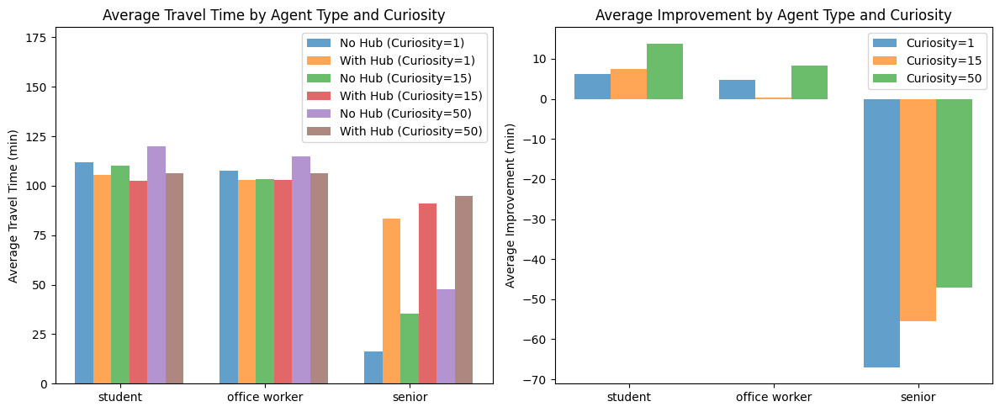

In [ ]:
curiosity_factors = [1, 15, 50]
agent_types = ['student', 'office worker', 'senior']

avg_no_hub = []
avg_with_hub = []
avg_improvement = []

for curiosity in curiosity_factors:
    df = improvement_results_baseline[curiosity]
    avg_no_hub.append(df['Avg No Hub'].values)
    avg_with_hub.append(df['Avg With Hub'].values)
    avg_improvement.append(df['Avg Improvement'].values)

avg_no_hub = np.array(avg_no_hub)
avg_with_hub = np.array(avg_with_hub)
avg_improvement = np.array(avg_improvement)

x = np.arange(len(agent_types))
width = 0.25

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

for i, curiosity in enumerate(curiosity_factors):
    ax[0].bar(x + i*width, avg_no_hub[i], width/2, label=f'No Hub (Curiosity={curiosity})', alpha=0.7)
    ax[0].bar(x + i*width + width/2, avg_with_hub[i], width/2, label=f'With Hub (Curiosity={curiosity})', alpha=0.7)

ax[0].set_ylim(0, np.max(avg_no_hub) + 60)
ax[0].set_xticks(x + width)
ax[0].set_xticklabels(agent_types)
ax[0].set_ylabel('Average Travel Time (min)')
ax[0].set_title('Average Travel Time by Agent Type and Curiosity')
ax[0].legend()

# Plot average improvement
for i, curiosity in enumerate(curiosity_factors):
    ax[1].bar(x + i*width, avg_improvement[i], width, label=f'Curiosity={curiosity}', alpha=0.7)

ax[1].set_xticks(x + width)
ax[1].set_xticklabels(agent_types)
ax[1].set_ylabel('Average Improvement (min)')
ax[1].set_title('Average Improvement by Agent Type and Curiosity')
ax[1].legend()

plt.tight_layout()
plt.show()

## Testing inprovements for people living near hubs

Mediocre results are expected, as we are testing uniformly across the entire area of Eindhoven, and many people, especially seniors, live at uncomfortable distances on foot from the nearest hub.

In truth, our target audience isn't just all students, young employed people or seniors, it's specifically those living near hubs. So let us build another simulation, in which we only test people who are within 15 minutes of a hub.

In [31]:
# Generate a denser grid than earlier
grid_points = generateGridForMultiPolygon(data['geodata'], spacing=0.003)

WALK_SPEED_KMH = 4
WALK_SPEED_M_PER_MIN = (WALK_SPEED_KMH * 1000) / 60  # meters per minute
MAX_MINUTES = 15
MAX_DISTANCE = WALK_SPEED_M_PER_MIN * MAX_MINUTES  # meters

filtered_points = []
for point in grid_points:
    nearest_hub = ag.dists.get_nearest_amenities(
        G=graph, location=(point.x, point.y), tag_list=('hub',), max_count=1
    )
    distance = nearest_hub['distance'].values[0] if not nearest_hub.empty else None
    # If no hub is found, skip this point
    if distance is None:
        continue
    # Check if the hub is within the maximum distance
    if distance > MAX_DISTANCE:
        continue
    # If at least one hub is within the distance, keep the point
    filtered_points.append(point)

grid_points = filtered_points
        
# Visualize the filtered grid points on a map
filtered_map = folium.Map(location=[51.4416, 5.4697], zoom_start=12, tiles="cartodbpositron")
for pt in grid_points:
    folium.CircleMarker(
        location=[pt.y, pt.x],
        radius=3,
        color='blue',
        fill=True,
        fill_opacity=0.5
    ).add_to(filtered_map)
display(HTML(filtered_map._repr_html_()))

Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity node
Getting nearest amenities from node
Getting nearest amenities from location
Getting cached amenity n

We can see the blue dots of the approximate location of every agent that will be part of our simulation, now belonging to a much more restricted space. Let us see what happens when we run again our simulation.

In [32]:
# Run the simulation for the filtered grid points
results_filtered = {}
for curiosity in curiosity_factors:
    print(f"\n=== Running simulations for filtered points with curiosity_factor={curiosity} ===")
    results_filtered[curiosity] = {}
    for agent_type in agent_types:
        print(f"  Running simulation for {agent_type} agents...")
        results_filtered[curiosity][agent_type] = run_simulation_for_type(
            agent_type=agent_type,
            n_days=5,
            curiosity_factor=curiosity
        )



=== Running simulations for filtered points with curiosity_factor=1 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loaded.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      ad

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Se

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41803655899132) is 42575176Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.439988668252994) is 42630208
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulati

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.433988668252994) is 7255775648
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.436988668252

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.

Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.447803811232205) is 42651371
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.479070204142033, 51.438803811232205) is 42627523
Nearest node data type:  <class 'int'>
Nea

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.482070204142033, 51.450803811232205) is 306684944
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.485070204142033, 51.438803811232205) is 4705147175
Nearest node data type:  <class 'int'>
Sel

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.441803811232205) is 11793312937
Nearest node data type:  <class 'int'>
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housen

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.450803811232205) is 12087364596
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                       

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.494070204142034, 51.450803811232205) is 12087364631
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  Na

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47093264518584) is 42714657
Nearest node data type:  <class 'int'

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.45893264518584) is 42682774
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eind

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.472180880064315, 51.45893264518584) is 11809667742Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47993264518584) is 42741439
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46493264518584) is 1264284039
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47093264518584) is 361127212
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.47693264518584) is 12215057339
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.45893264518584) is 42683825
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191      

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.47393264518584) is 42723418
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    mai

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.478180880064315, 51.45893264518584) is 42683229Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Nearest node for residence (5.475180880064315, 51.47693264518584) is 502948828
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46493264518584) is 2636656090
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.45293264518584) is 247261529
Nearest node data type:  <class 'int'>
Nearest node for residence (5.481180880064315, 51.46493264518584) is 8904660400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47693264518584) is 42733175
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.481180880064315, 51.46793264518584) is 42707406Data already loaded.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.481180880064315, 51.47093264518584) is 42716658
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45293264518584) is 27031587
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simul

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515Nearest node for residence (5.487180880064315, 51.45293264518584) is 54744397
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Nearest node for res

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.487180880064315, 51.45893264518584) is 42683072
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904) 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.490180880064315, 51.45893264518584) is 42684248Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loade

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs si

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43818_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288Nearest node for residence (5.441182604905862, 51.417536160818585) is 42574127
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Neare

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name ope

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.450182604905862, 51.417536160818585) is 42575233
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]Day with hubs simulation complete.
Day with hubs simulation complete.

Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederikla

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41503655899132) is 42566448
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.497914898614994, 51.41803655899132) is 42576704
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.42403655899132) is 42591291
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 colu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.5111995625782555, 51.436988668252994) is 8763753603
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.514199562578256, 51.442988668252994) is 11844265842
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.514199562578256, 51.439988668252994) is 42629647
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... buil

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergenc

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.436988668252994) is 42622155
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag            

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.523199562578256, 51.442988668252994) is 42637966
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.523199562578256, 51.433988668252994) is 8107699437
Nearest node data type:  <class 'int'>
Nearest node for residence (5.5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.473070204142033, 51.441803811232205) is 9508402476
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4    

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.476070204142033, 51.435803811232205) is 12032936774
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.436

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.441803811232205) is 27386660
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.Nearest node for residence (5.479070204142033, 51.444803811232205) is 42642687
Nearest node data type:  <class 'int'>

Nearest node for residence (5.479070204142033, 51.438803811232205) is 42627523
Nearest node data type:  <class 'int'>
D

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.482070204142033, 51.444803811232205) is 42643692
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.482070204142033, 51.441803811232205) is 11758082103
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation compl

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      o

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Nearest node for residence (5.485070204142033, 51.444803811232205) is 9999909936Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.

Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber ad

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   



c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46493264518584) is 2573720257
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Nearest node for residence (5.463180880064314, 51.47693264518584) is 42733611
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selec

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.45893264518584) is 42682774
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected of

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node for residence (5.4691808800643145, 51.46793264518584) is 1271593261
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.46493264518584) is 4069603428
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstra

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.4691808800643145, 51.47393264518584) is 8857204686
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postc

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47993264518584) is 42741439
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

               

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.4751808800

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:stree

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46493264518584) is 2636656090
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city ad

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Nearest node for residence (5.481180880064315, 51.45293264518584) is 247261529
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.46493264518584) is 8904660400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47993264518584) is

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46493264518584) is 42700981
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47693264518584) is 42733193
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45893264518584) is 42683257
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        ge

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikid

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.

Nearest node for residence (5.487180880064315, 51.45293264518584) is 54744397
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45893264518584) is 42684248
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45293264518584) is 8907178735
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.493180880064315, 51.45293264518584) is 256724376Nearest node for residence (5.493180880064315, 51.45593264518584) is 2766779912
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.45893264518584) is 42679999
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN            

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidat

c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43818_y51.41754'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Ne

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.447182604905862, 51.420536160818585) is 295680293Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.45018260490

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.488914898614993, 51.41503655899132) is 2859680039
Nearest node data type:  <class 'int'>

Nearest node for residence (5.488914898614993, 51.41803655899132) is 42574317
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.488914898614993, 51.42103655899132) is 42583635
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.485914898614993, 51.42103655899132) is 42583298
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Nearest node for residence (5.4919148986149935, 51.41503655899132) is 42566448
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41803655899132) is 42575176
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation comp

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node for residence (5.494914898614994, 51.41503655899132) is 42566837
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.41803655899132) is 42574770
Nearest node data type:  <class 'int'>
Nearest node for residence (5.494914898614994, 51.42103655899132) is 8932022621
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.41803655899132) is 42576704
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.42403655899132) is 42591291
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Day with hubs 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.514199562578256, 51.442988668252994) is 11844265842
Nearest node data type:  <class 'int'>
Nearest node for residence (5.517199562578256, 51.433988668252994) is 42615892
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.436988668252994) is 42621630
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.439988668252994) is 42630208
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.442988668252994) is 7101745330
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.43398866825

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.442988668252994) is 7101745313
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.436988668252994) is 42622155
Nearest node data type:  <class 'int'>
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.523199562578256, 51.433988668252994) is 8107699437
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.Nearest node for residence (5.523199562578256, 51

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.523199562578256, 51.442988668252994) is 42637966Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.526199562578256, 51.436988668252994) is 5571463549
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.526199562578256, 51.442988668252994) is 7101745293
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.529199562578256, 51.442988668252994) is 42638220
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.470070204142033, 51.438803811232205) is 5228916057
Nearest node data type:  <class 'int'>

Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.470070204142033, 51.441803811232205) is 102525144
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.470070204142033, 51.444803811232205) is 42643053
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.447803811232205) is 42651371
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.444803811232205) is 5045403955
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.438803811232205) is 42627523
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.444803811232205) is 42642687
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.447803811232205) is 42651495
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.482070204142033, 51.435803811232205) is 12032936824
Nearest no

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.435803811232205) is 7646923869
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911Data already loaded.
Data already loaded.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.438803811232205) is 4705147175
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.444803811232205) is 9999909936
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.441803811232205) is 11793312937
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.450803811232205) is 10253329523
Nearest node data type:  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.494070204142034, 51.450803811232205) is 12087364631
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.450803811232205) is 12087364596
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.47693264518584) is 42733611
Nearest node data type:  <class 'int'>
Nearest node for residence (5.463180880064314, 51.46793264518584) is 42708770
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46493264518584) is 2573720257
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47093264518584) is 42714657
Nearest node dat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47693264518584) is 8573352241
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.45893264518584) is 42682774
Nearest node data type:  <class 'int'>
Nearest node for residence (5.4691808800643145, 51.46493264518584) is 4069603428
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.46193264518584) is 8573308643
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hub

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.4691808800643145, 51.47393264518584) is 8857204686
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47693264518584) is 42732063
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.4691808800643145, 51.47993264518584) is 42741439
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Nearest node for residence (5.472180880064315, 51.45893264518584) is 11809667742
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46493264518584) is 1264284039
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47093264518584) is 361127212
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47693264518584) is 12215057339
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.45893264518584) is 42683825
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.46193264518584) is 42691069
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.46493264518584) is 318155720
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Nearest node for residence (5.475180880064315, 51.46793264518584) is 502535139
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.47393264518584) is 42723418
Nearest node data type:  <class 'int'>
Nearest node for residence (5.475180880064315, 51.47093264518584) is 502590070
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.47693264518584) is 502948828
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45893264518584) is 42683229
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Data already loaded.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46493264518584) is 2636656090
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47093264518584) is 6831227067
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest no

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.45293264518584) is 247261529
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.481180880064315, 51.46493264518584) is 8904660400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.46793264518584) is 42707406
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.481180880064315, 51.47393264518584) is 42724502
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47093264518584) is 42716658
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47693264518584) is 10068609521
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45293264518584) is 27031587
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.484180880064315, 51.45893264518584) is 42683257
Nearest node data type:  <class 'int'>
Data already loaded.

Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation c

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.487180880064315, 51.45293264518584) is 54744397
Nearest node data type:  <class 'int'>
Data already loaded.
Nearest node for residence (5.487180880064315, 51.45893264518584) is 42683072
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.487180880064315, 51.45593264518584) is 5869460053
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.48718088

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.490180880064315, 51.45293264518584) is 8907178735
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45893264518584) is 42684248
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45293264518584) is 256724376
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Nearest node for residence (5.493180880064315, 51.45593264518584) is 2766779912
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45893264518584) is 42683164
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.45893264518584) is 42679999
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 


=== Running simulations for filtered points with curiosity_factor=15 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.482914898614993, 51.41503655899132) is 42567737Nearest node for residence (5.482914898614993, 51.41803655899132) is 2573810816
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Nearest node for residence (5.482914898614993, 51.42103655899132) is 8570078829
Nearest node data type:  <class 'int'>
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                               

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41803655899132) is 42575176
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.508199562578255, 51.439988668252994) is 42630312Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.497914898614994, 51.42103655899132) is 9981480662
Nearest node data type:  <class 'int'>
Nearest node for residence (5.5111995625782555, 51.439988668252994) is 42629312
Nearest node data type:  <class 'int'>
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  uni

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                     

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   N

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hour

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.433988668252994) is 7255775648
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Nearest node for residence 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.523199562578256, 51.433988668252994) is 8107699437
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.526199562578256, 51.436988668252994) is 5571463549
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.529199562578256, 51.442988668252994) is 42638220
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.470070204142033, 51.438803811232205) is 5228916057
Nearest node data type:  <class 'int'>
Nearest node for residence (5.470070204142033, 51.441803811232205) is 102525144
Nearest node data type:  <class 'int'>
Nearest node for residence (5.526199562578256, 51.442988668252994) is 7101745293
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.470070204142033, 51.444803811232205) is 42643053
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.4730702041

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Nearest node for residence (5.473070204142033, 51.444803811232205) is 1634437125
Nearest node data type:  <class 'int'>
Nearest node for residence (5.476070204142033, 51.438803811232205) is 520321219
Nearest node data type:  <class 'int'>
Ne

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.476070204142033, 51.441803811232205) is 1886063299Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.444803811232205) is 5045403955Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.447803811232205) is 42651371
Nearest node dat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.4358038112322

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.47907020414203

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.482070204142033, 51.444803811232205) is 42643692
Nearest node data type:  <class 'int'>
Nearest node for residence (5.482070204142033, 51.441803811232205) is 11758082103
Nearest node data type:  <class 'int'>
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already lo

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.435803811232205) is 7646923869
Nearest node data

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.450803811232205) is 144249483
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.441803811232205) is 11793312937
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

              

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... buildi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.450803811232205) is 12087364596
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.494070204142034, 51.450803811232205) is 12087364631
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.46793264518584) is 42708770
Nearest node data type:  <class 'int'>
Nearest node for residence (5.463180880064314, 51.46493264518584) is 42700275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.47693264518584) is 42733611
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1       

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.4691808800643145, 51.47993264518584) is 42741439
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simul

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.45893264518584) is 11809667742
Nearest node data type:  <class 'int'>
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  colle

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46793264518584) is 361127216
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.472180880064315, 51.47693264518584) is 12215057339Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.46193264518584) is 42691069
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.475180880064315, 51.47693264518584) is 502948828Nearest node for residence (5.475180880064315, 51.47393264518584) is 42723418
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest nod

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46493264518584) is 2636656090
Nearest node data type:  <class 'int'>
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wik

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats eme

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47693264518584) is 42733175
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simul

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.481180880064315, 51.47093264518584) is 42716658Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.46793264518584) is 42707406
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.45293264518584) is 27031587
Nearest node data type:  <class 'int'>
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
3

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.47693264518584) is 42733613
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:str

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Nea

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.447182604905862, 51.423536160818585) is 42589311
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wiki

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street b

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.5111995625782555, 51.442988668252994) is 119567096
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata bra

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN       

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for res

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Nearest node for residence (5.470070204142033, 51.441803811232205) is 102525144
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven              

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   N

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node for residence (5.476070204142033, 51.444803811232205) is 5045403955
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.476070204142033, 51.447803811232205) is 42651371Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.485070204142033, 51.435803811232205) is 7646923869Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.482070204142033, 51.450803811232205) is 306684944
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.444803811232205) is 9999909936
Nearest node data type:  <class 'int'>
Nearest node for residence (5.485

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.450803

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulati

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.463180880064314, 51.46793264518584) is 42708770
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                        geome

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46493264518584) is 2573720257
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.47093264518584) is 42714657
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.47693264518584) is 8573352241
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.45893264518584) is 42682774
Nearest node data type:  <class 'int'>
S

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.4691808800643145, 51.46193264518584) is 8573308643
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.4691808800643145, 51.46493264518584) is 4069603428
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centro

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47693264518584) is 42732063
Nearest node data type:  <class 'int'>
Nearest node for residence (5.4691808800643145, 51.47393264518584) is 8857204686
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47993264518584) is 42741439
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for re

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46493264518584) is 1264284039
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for r

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.472180880064315, 51.47693264518584) is 12215057339Nearest node for residence (5.475180880064315, 51.46193264518584) is 42691069
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.47693264518584) is 502948828
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47093264518584) is 6831227067
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46493264518584) is 2636656090
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.46493264518584) is 8904660400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  PO

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47093264518584) is 42716658
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47693264518584) is 10068609521
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce h

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.481180880064315, 51.47993264518584) is 42741703Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data al

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand bra

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.487180880064315, 51.47693264518584) is 42733613Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.45293264518584) is 54744397
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.487180880064315, 51.45593264518584) is 5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]Nearest node for residence (5.493180880064315, 51.45293264518584) is 256724376
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest nod

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45893264518584) is 426831

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day w

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43818_y51.41754'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.417536160818585) is 42574127
Nearest node data type:  <class 'int'>
Near

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.479914898614993, 51.41803655899132) is 2573830767
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.485914898614993, 51.42103655899132) is 42583298
Nearest node data type:  <class 'int'>
Nearest node for residence (5.482914898614993, 51.41803655899132) is 2573810816
Nearest node data type:  <class 'int'>
Nearest node for residence (5.482914898614993, 51.42103655899132) is 8570078829
Nearest node data type:  <class 'int'>
Nearest node for residence (5.485914898614993, 51.41803655899132) is 42576996
Nearest node data type:  <class 'int'>
Nearest node for residence (5.488914898614993, 51.41503655899132) is 2859680039
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.488914898614993, 51.42103655899132) is 4258

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.4919148986149935, 51.41503655899132) is 42566448
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41803655899132) is 42575176
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.41503655899132) is 42566837
Nearest node data type:  <class 'int'>
Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.41803655899132) is 42574770
Nearest node data type:  <class 'int'>
Day w

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.514199562578256, 51.436988668252994) is 42623320Nearest node for residence (5.5111995625782555, 51.442988668252994) is 119567096
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Nearest node for residence (5.5111995625782555, 51.439988668252994) is 42629312
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.514199562578256, 51.439988668252994) is 42629647
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.514199562578256, 51.442988668252994) is 11844265842
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.517199562578256, 51.4339

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Data already loaded.Data already loaded.
Data already loaded.

Nearest node for residence (5.517199562578256, 51.436988668252994) is 42621630
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.439988668252994) is 42630208
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.442988668252994) is 7101745330
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.433988668252994) is 7255775648
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.436988668252994) is 42622155
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.442988668252994) is 7101745313
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.523199562578256, 51.436988668252994) is 455604714
Nearest node data type:  <class 'int'>
Nearest node for residence (5.523199562578256, 51.433988668252994) is 8107699437
Nearest node data type:  <class 'int'>
Day with hubs simulation complete

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.470070204142033, 51.438803811232205) is 5228916057
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.529199562578256, 51.442988668252994) is 42638220
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.470070204142033, 51.441803811232205) is 102525144
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.470070204142033, 51.444803811232205) is 42643053
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.438803811232205) is 262453764
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.444803811232205) is 1634437125
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.441803811232205) is 9508402476
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.435803811232205) is 12032936774
Nearest node data type:  <class 'int'>
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.438803811232205) is 520321219
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.441803811232205) is 1886063299
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.444803811232205) is 5045403955
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.447803811232205) is 42651371
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.438803811232205) is 42627523
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.479070204142033, 51.441803811232205) is 27386660
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.444803811232205) is 42642687
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.447803811232205) is 42651495
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs si

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.482070204142033, 51.444803811232205) is 42643692
Nearest node data type:  <class 'int'>
Nearest node for residence (5.482070204142033, 51.441803811232205) is 11758082103
Nearest node data type:  <class 'int'>
Nearest node for residence (5.482070204142033, 51.450803811232205) is 306684944
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.485

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.450803811232205) is 10253329523
Nearest node data type:  <class 'int'>
Nearest node for residence (5.485070204142033, 51.444803811232205) is 9999909936
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.441803811232205) is 11793312937
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.450803811232205) is 144249483
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.450803811232205) is 12087364596
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.46493264518584) is 42700275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.494070204142034, 51.450803811232205) is 12087364631
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.47693264518584) is 42733611
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.46493264518584) is 2573720257
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.466180880064314, 51.47093264518584) is 42714657
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residen

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.45893264518584) is 42682774
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47693264518584) is 8573352241
Nearest node data type:  <class 'int'>
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.46193264518584) is 8573308643
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.46493264518584) is 4069603428
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47393264518584) is 8857204686
Nearest node data type:  <class 'int'>
Nearest node for residence (5.4691808800643145, 51.47693264518584) is 42732063
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.46793264518584) is 1271593261
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.472180880064315, 51.45893264518584) is 11809667742
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.45893264518584) is 42683825
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.47693264518584) is 12215057339
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.46193264518584) is 42691069
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.46793264518584) is 502535139
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.4649326451858

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46193264518584) is 42691058
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.45893264518584) is 42683229
Nearest node data type:  <class 'int'>
Data already loaded.
Nearest node for residence (5.478180880064315, 51.46493264518584) is 2636656090
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.Near

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.478180880064315, 51.47693264518584) is 42733175Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.45293264518584) is 247261529
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.46493264518584) is 8904660400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.481180880064315, 51.46793264518584) is 42707406Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47093264518584) is 42716658
Nearest node data type:  <class 'int'>
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47393264518584) is 42724502
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47993264518584) is 42741703
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.481180880064315, 51.47693264518584) is 10068609521
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45293264518584) is 27031587
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.45893264518584) is 42683257
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.484180880064315, 51.46493264518584) is 42700981
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515Data already loaded.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47693264518584) is 42733193
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.45593264518584) is 5869460053
Ne

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.487180880064315, 51.45893264518584) is 42683072
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.47693264518584) is 42733613
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45293264518584) is 8907178735
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.Data already loaded.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.490180880064315, 51.45893264518584) is 42684248
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45593264518584) is 2766779912
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45293264518584) is 256724376
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.493180880064315, 51.45893264518584) is 42683164Day with hubs simulation complete.

Nearest node data type:  <class 'i

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 


=== Running simulations for filtered points with curiosity_factor=50 ===
  Running simulation for student agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.420536160818585) is 8863398518
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 5

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.450182604905862, 51.420536160818585) is 42582983Nearest node for residence (5.450182604905862, 51.423536160818585) is 42589706
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.453182604905862, 51.417536160818585) is 42575499
Nearest node data type:  <class 'int'>
Nearest node for residence (5.450182604905862, 51.426536160818586) is 42598413
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.Nearest node for residence (5.453182604905862, 51.420536160818585) is 42583473
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residenc

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       g

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41803655899132) is 42575176
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN   

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.41803655899132) is 42574770
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.42403655899132) is 42591291
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.41503655899132) is 42566837
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.436988668252994) is 42621630
Nearest node data type:  <class 'int'>
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.433988668252994) is 426

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1        5612MA  Rachelsmolen   NaN            NaN   

      brand:wikipedia                         name opening_hours  ...  \
21013             NaN  Fontys Hogeschool Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21013            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21013  POINT (5.48089 51.45179)   8749756016  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:         

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.436988668252994) is 42622155
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.442988668252994) is 7101745313Nearest node for residence (5.523199562578256, 51.433988668252994) is 8107699437
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.526199562578256, 51.436988668252994) is 5571463549Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.

Nearest node data type:  <class 'int'>
Nearest node for residence (5.526199562578256, 51.442988668252994) is 7101745293
Nearest node data type:  <class 'int'>
Nearest node for residence (5.470070204142

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]Day with hubs simulation complete.
Day with hubs simulation complete.

Data already loaded.
Selected university:                                                 geometry  addr:city  \
21013  POLYGON ((5.47992 51.45267, 5.47969 51.45268, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21013                1

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.435803811232205) is 1520517657
Nearest node data type:  <class 'int'>
Nearest node for 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.479070204142033, 51.444803811232205) is 42642687
Nearest node data type:  <class 'int'>

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.482070204142033, 51.435803811232205) is 12032936824
Nearest node data type:  <class 'int'>
Da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.482070204142033, 51.438803811232205) is 1271057137
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51301  POINT (5.45656 51.47422)   1703189280  

[1 rows x 224 columns]
Data already lo

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]
Data already loaded.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      op

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.4880702041420335, 51.441803811232205) is 11793312937Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.450803811232205) is 144249483
Nearest node data type:  <class 'int'>

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Sport           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
37531       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
37531  POINT (5.45502 51.47803)   9922358829  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected university:                    geometry  addr:ci

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.44637 51.4752, 5.44635 51.47519, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51191              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia            name opening_hours  ... building:flats  \
51191             NaN  Summa Business           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
51191       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid nearest_node  
51191  POINT (5.44611 51.47465)  10121451341  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation comple

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.47693264518584) is 42733611
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.46793264518584) is 42708770
Nearest node data type:  <class 'int'>
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 row

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:street brand brand:wikidata  \
21001                3        5612AE  Groene Loper   NaN            NaN   

      brand:wikipedia                               name opening_hours  ...  \
21001             NaN  Technische Universiteit Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
21001            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
21001  POINT (5.48974 51.44872)  11385827898  

[1 rows x 224 columns]
Data already loaded.

Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49       

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.4691808800643145, 51.46193264518584) is 8573308643
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47393264518584) is 8857204686
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loaded.

Selected university:                                                 geometry addr:city  \
51191  POLYGON ((5.4463

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.4691808800643145, 51.47993264518584) is 42741439
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.45893264518584) is 11809667742
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven               

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Nearest node for residence (5.472180880064315, 51.47693264518584) is 12215057339
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.45893264518584) is 42683825
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.46193264518584) is 42691069
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
21001  POLYGON ((5.49623 51.45105, 5.49475 51.45165, ...  Eindhoven   

      addr:housenumber addr:postcode   addr:stre

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hou

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                                                 geometry  addr:city  \
32287  POLYGON ((5.48966 51.45307, 5.4898 51.45416, 5...  Eindhoven   

      addr:housenumber addr:postcode                addr:street brand  \
32287                2        5631BN  Ds Theodor Fliednerstraat   NaN   

      brand:wikidata brand:wikipedia    name opening_hours  ...  \
32287            NaN             NaN  Vector           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area    main_tag  \
32287            NaN       NaN     NaN   NaN     NaN    NaN  NaN  university   

                       centroid nearest_node  
32287  POINT (5.49075 51.45358)   8907178734  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.475180880064315, 51.47393264518584) is 42723418
Nearest node data type:  <class 'int'>
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
20555  POINT (5.4749 51.43972)  Eindhoven               14        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia  \
20555  Emmasingel   NaN            NaN             NaN   

                           name opening_hours  ... building:flats emergency  \
20555  Design Academy Eindhoven           NaN  ...            NaN       NaN   

      ref:rce hoops sport_1 boules area    main_tag                 centroid  \
20555     NaN   NaN     NaN    NaN  NaN  university  POINT (5.4749 51.43972)   

      nearest_node  
20555    312790009  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.478180880064315, 51.4769326

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Nearest node for residence (5.481180880064315, 51.45293264518584) is 247261529Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Nearest node for residence (5.481180880064315, 51.46493264518584) is 8904660400
Nearest node data type:  <class 'int'>

Selected university:                                                 geometry addr:city  \
37531  POLYGON ((5.4552 51.47823, 5.45517 51.47826, 5...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
37531              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia         name opening_hours  ... building:flats  \
37531             NaN  Summa Spo

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.46793264518584) is 42707406
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data a

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47993264518584) is 42741703
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47693264518584) is 10068609521
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergen

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47693264518584) is 42733193
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected university:                                                 geometry addr:city  \
51301  POLYGON ((5.45583 51.47438, 5.45635 51.47374, ...       NaN   

      addr:housenumber addr:postcode addr:street brand brand:wikidata  \
51301              NaN           NaN         NaN   NaN            NaN   

      brand:wikipedia                       name opening_hours  ...  \
51301             NaN  Politieacademie Eindhoven           NaN  ...   

      building:flats emergency ref:rce hoops sport_1 boules area main_tag  \
51301            NaN       NaN     NaN   NaN     NaN    NaN  NaN  college   

                       centroid

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20833  POINT (5.46254 51.43515)  Eindhoven                3        5616EA   

               addr:street brand brand:wikidata brand:wikipedia  \
20833  Willem de Rijkelaan   NaN            NaN             NaN   

                name opening_hours  ... building:flats emergency ref:rce  \
20833  Summa College           NaN  ...            NaN       NaN     NaN   

      hoops sport_1 boules area main_tag                  centroid  \
20833   NaN     NaN    NaN  NaN  college  POINT (5.46254 51.43515)   

      nearest_node  
20833  11220373402  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.45293264518584) is 54744397
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.45593264518584) is 5869460053
Neares

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]Nearest node for residence (5.487180880064315, 51.47693264518584) is 42733613
Nearest node data type:  <class 'int'>

Data already loaded.
Nearest node for residence (5.487180880064315, 51.45893264518584) is 42683072
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected university:                        geometry  addr:city addr:housenumber addr:postcode  \
20558  POINT (5.47446 51.43904)  Eindhoven               28        5611AZ   

      addr:street brand brand:wikidata brand:wikipedia               name  \
20558  Emmasingel   NaN            NaN             NaN  Fontys Hogeschool   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20558           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area    main_tag                  centroid nearest_node  
20558    NaN  NaN  university  POINT (5.47446 51.43904)     42627534  

[1 rows x 224 columns]Nearest node for residence (5.490180880064315, 51.45293264518584) is 8907178735
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <cla

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected university:                       geometry  addr:city addr:housenumber addr:postcode  \
32217  POINT (5.47584 51.4564)  Eindhoven                1        5623AD   

      addr:street brand brand:wikidata brand:wikipedia            name  \
32217  Kaakstraat   NaN            NaN             NaN  De Rooi Pannen   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32217           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                 centroid nearest_node  
32217    NaN  NaN  college  POINT (5.47584 51.4564)   8615238354  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven     

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.490180880064315, 51.45893264518584) is 42684248Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45293264518584) is 256724376
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45593264518584) is 2766779912
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs si

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.493180880064315, 51.45893264518584) is 42683164Day with hubs simulation complete.
Selected university:                    geometry  addr:city addr:housenumber addr:postcode  \
7  POINT (5.43216 51.42042)  Eindhoven               49        5653LC   

  addr:street brand brand:wikidata brand:wikipedia              name  \
7        Croy   NaN            NaN             NaN  Summa Automotive   

  opening_hours  ... building:flats emergency ref:rce hoops sport_1 boules  \
7           NaN  ...            NaN       NaN     NaN   NaN     NaN    NaN   

  area main_tag                  centroid nearest_node  
7  NaN  college  POINT (5.43216 51.42042)     42581379  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.45893264518584) is 42679999
Nearest node data type:  <class 'in

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43518_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for adult agents...
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.417536160818585) is 42574127
Nearest node data type:  <class 'int'>
Neare

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.447182604905862, 51.426536160818586) is 295679310
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN         

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:hou

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41803655899132) is 42575176
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation comp

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.5111995625782555, 51.436988668252994) is 8763753603
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Nearest node for residence (5.5111995625782555, 51.442988668252994) is 119567096
Nearest node data type:  <class 'int'>
Nearest node for residence (5.514199562578256, 51.436988668252994) is 42623320
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POI

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.436988668252994) is 42622155
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.442988668252994) is 7101745313
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.523199562578256, 51.433988668252994) is 8107699437
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.526199562578256, 51.433988668252994) is 769112708
Nearest node data type:  <class 'int'>
Nearest node for residence (5.523199562578256, 51.442988668252994) is 42637966
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation compl

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.529199562578256, 51.442988668252994) is 42638220
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Nearest nod

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.435803811232205) is 12032936774
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postc

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.476070204142033, 51.438803811232205) is 520321219Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:hous

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.

Nearest node for residence (5.476070204142033, 51.444803811232205) is 5045403955
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:ho

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.47

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.482070204142033, 51.435803811232205) is 12032936824
Nearest node data type:  <class 'int'>

Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street b

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.482070204142033, 51.441803811232205) is 11758082103
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry addr:city addr:housenumber addr:postco

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.435803811232205) is 7646923869
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  P

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.450803811232205) is 12087364596
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.46493264518584) is 42700275
Nearest node data type:  <class 'int'>
Nearest node for residence (5.494070204142034, 51.450803811232205) is 12087364631
Nearest node data type:  <class 'int'>
Day with hubs simulation comp

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.46793264518584) is 42708770
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
D

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.466180880064314, 51.46493264518584) is 2573720257Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.45893264518584) is 42682774
Nearest node data type:  <class 'int'>
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Selected office:                        geometry  addr:city addr:ho

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complet

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.472180880064315, 51.46193264518584) is 42691056Day with hubs simulation complete.
Day with hubs simulation complete.

Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.46493264518584) is 1264284039
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA  

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for resid

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.46493264518584) is 318155720
Nearest node data type:  <class 'int'>
Nearest node for residence (5.475180880064315, 51.46793264518584) is 502535139
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.47093264518584) is 502590070
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag        

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]Day with hubs simulation complete.

Data already loaded.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15781  POINT (5.51946 51.42982)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15781         NaN   NaN            NaN             NaN  D07 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15781           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15781    NaN  NaN      yes  POINT (5.51946 51.42982)   1631231567  

[1 rows x 224 columns]
Data already loaded.

Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Nearest node for residence (5.478180880064315, 51.47093264518584) is 6831227067
Nearest node data type:  <class 'int'>
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
15769  POINT (5.51331 51.43528)  Eindhoven               83        5642JC   

              addr:street brand brand:wikidata brand:wikipedia  \
15769  Quinten Matsyslaan   NaN            NaN             NaN   

                                  name opening_hours  ... building:flats  \
15769  OneSource Building Technologies           NaN  ...            NaN   

      emergency ref:rce hoops sport_1 boules area main_tag  \
15769       NaN     NaN   NaN     NaN    NaN  NaN      yes   

                       centroid nearest_node  
15769  POINT (5.51331 51.43528)     42619800  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day wit

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243999417  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.45293264518584) is 247261529
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation co

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boule

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Nearest node for residence (5.481180880064315, 51.47093264518584) is 42716658
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.

Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.42915)   

   nearest_node  
17   2018808953  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
N

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.45893264518584) is 42683257
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20484  POINT (5.49146 51.43602)  Eindhoven                4        5611TV   

          addr:street brand brand:wikidata brand:wikipedia    name  \
20484  Breitnerstraat   NaN            NaN             NaN  Crafug   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20484           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20484    NaN  NaN      yes  POINT (5.49146 51.43602)    243

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47693264518584) is 42733193
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hub

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.45593264518584) is 5869460053
Nearest node data type:  <class 'int'>

Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20899  POINT (5.46692 51.44101)  Eindhoven               10        5616NH   

        addr:street brand brand:wikidata brand:wikipedia              name  \
20899  Frederiklaan   NaN            NaN             NaN  ASML building 14   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20899           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20899    NaN  NaN      yes  POINT (5.46692 51.44101)     42632011  

[1 rows x 224 columns]
Data already loaded.
Nearest node for residence (5.487180880064315, 51.45893264518584) is 42683072
Nearest node data type:  <class 'int'>
Day with hubs simulation complete

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Selected office:                        geometry addr:city addr:housenumber addr:postcode  \
15780  POINT (5.51936 51.42942)       NaN              NaN           NaN   

      addr:street brand brand:wikidata brand:wikipedia             name  \
15780         NaN   NaN            NaN             NaN  D06 Hoofdgebouw   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
15780           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
15780    NaN  NaN      yes  POINT (5.51936 51.42942)   1631231567  

[1 rows x 224 columns]
Data already loaded.

Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   N

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.490180880064315, 51.45893264518584) is 42684248
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20721  POINT (5.47342 51.44276)  Eindhoven              200        5611ZC   

      addr:street brand brand:wikidata brand:wikipedia            name  \
20721  Fellenoord   NaN            NaN             NaN  Staatvandienst   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20721           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20721    NaN  NaN      yes  POINT (5.47342 51.44276)     42636661  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
32206  POINT (5.48097 51.45969)  Eindhoven               12        5623KK   

                  addr:street brand brand:wikidata brand:wikipedia    name  \
32206  Generaal Berenschotpad   NaN            NaN             NaN  Strang   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
32206           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
32206    NaN  NaN      yes  POINT (5.48097 51.45969)     42685915  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                        geometry  addr:city addr:housenumber addr:postcode  \
20481  POINT (5.49057 51.43653)  Eindhoven               19        5611VA   

           addr:street brand brand:wikidata brand:wikipedia            name  \
20481  Kanaaldijk-Zuid   NaN            NaN             NaN  Place for Bizz   

      opening_hours  ... building:flats emergency ref:rce hoops sport_1  \
20481           NaN  ...            NaN       NaN     NaN   NaN     NaN   

      boules area main_tag                  centroid nearest_node  
20481    NaN  NaN      yes  POINT (5.49057 51.43653)   8872460941  

[1 rows x 224 columns]
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.45893264518584) is 42679999
Nearest node data type:  <class 'int'>
Day with 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Selected office:                     geometry  addr:city addr:housenumber addr:postcode  \
17  POINT (5.44889 51.42915)  Eindhoven               17        5653MA   

    addr:street brand brand:wikidata brand:wikipedia  \
17  Beemdstraat   NaN            NaN             NaN   

                            name opening_hours  ... building:flats emergency  \
17  Hoofdvestiging Van der Meijs           NaN  ...            NaN       NaN   

   ref:rce hoops sport_1 boules area main_tag                  centroid  \
17     NaN   NaN     NaN    NaN  NaN      yes  POINT (5.44889 51.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.43818_y51.41454'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

  Running simulation for senior agents...
Nearest node for residence (5.435182604905862, 51.417536160818585) is 1880955909
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.414536160818585) is 8863398504
Nearest node data type:  <class 'int'>
Nearest node for residence (5.435182604905862, 51.420536160818585) is 42582225
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.417536160818585) is 42573777
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.417536160818585) is 42574127
Nearest node data type:  <class 'int'>
Nearest node for residence (5.441182604905862, 51.414536160818585) is 11847649880
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.420536160818585) is 11303174126
Nearest node data type:  <class 'int'>
Nearest node for residence (5.438182604905862, 51.423536160818585) is 42590288
Nearest node data type:  <class 'int'>
Near

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.488914898614993, 51.42103655899132) is 42583635
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.488914898614993, 51.41803655899132) is 42574317
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41503655899132) is 42566448
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs 

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.41803655899132) is 42575176
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4919148986149935, 51.42103655899132) is 42584400
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.494914898614994, 51.41503655899132) is 42566837
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.Day with hubs simulation complete.

Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.5111995625782555, 51.436988668252994) is 8763753603
Nearest node data type:  <class 'int'>
Nearest node for residence (5.5111995625782555, 51.442988668252994) is 119567096
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.5111995625782555, 51.439988668252994) is 42629312
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.514199562578256, 51.436988668252994) is 42623320
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.514199562578256, 51.439988668252994) is 42629647
Nearest node data type:  <class 'int'>


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.514199562578256, 51.442988668252994) is 11844265842
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.517199562578256, 51.433988668252994) is 42615892
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.439988668252994) is 42630208
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.517199562578256, 51.436988668252994) is 42621630
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.517199562578256, 51.442988668252994) is 7101745330
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.433988668252994) is 7255775648
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.436988668252994) is 42622155
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.439988668252994) is 42629576
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.520199562578256, 51.442988668252994) is 7101745313
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation com

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Nearest node for residence (5.526199562578256, 51.436988668252994) is 5571463549
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.526199562578256, 51.433988668252994) is 769112708
Nearest node data type:  <class 'int'>
Nearest node for residence (5.526199562578256, 51.442988668252994) is 7101745293
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.529199562578256, 51.442988668252994) is 42638220
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.470070204142033, 51.441803811232205) is 102525144
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.470070204142033, 51.438803811232205) is 5228916057
Nearest node da

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Data already loaded.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.473070204142033, 51.438803811232205) is 262453764
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.470070204142033, 51.444803811232205) is 42643053
Nearest node data type:  <class 'int'>
Nearest node for residence (5.473070204142033, 51.444803811232205) is 1634437125
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.435803811232205) is 12032936774
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.438803811232205) is 520321219
Nearest node data type:  <class 'int'>
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.441803811232205) is 1886063299
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.447803811232205) is 42651371
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.438803811232205) is 42627523
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.476070204142033, 51.444803811232205

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.479070204142033, 51.447803811232205) is 42651495
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.482070204142033, 51.438803811232205) is 1271057137
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.Nearest node for residence (5.482070204142033, 51.444803811232205) is 42643692
Nearest node data type:  <class 'int'>
Nearest node for residence (5.482070204142033, 51.435803811232205) is 12032936824
Nearest node data type:  <class 'int'>
Day with hubs

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.438803811232205) is 4705147175
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.441803811232205) is 42633911
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.444803811232205) is 9999909936
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.
Nearest node for residence (5.485070204142033, 51.450803811232205) is 10253329523
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.441803811232205) is 11793312937
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4880702041420335, 51.450803811232205) is 144249483
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.491070204142034, 51.447803811232205) is 5148420243
Nearest node data type:  <class 'int'>
Nearest node for residence (5.491070204142034, 51.450803811232205) is 12087364596
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs sim

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Nearest node for residence (5.494070204142034, 51.450803811232205) is 12087364631
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.46493264518584) is 42700275
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.46793264518584) is 42708770
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.46193264518584) is 42690747
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.463180880064314, 51.47693264518584) is 42733611
Nearest node data type:

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Nearest node for residence (5.466180880064314, 51.46793264518584) is 42707964Day with hubs simulation complete.
Data already loaded.

Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47393264518584) is 42725110
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.466180880064314, 51.47693264518584) is 8573352241
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.466180880064314, 51.47993264518584) is 5852001332
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Nearest node for residence (5.46918088

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47393264518584) is 8857204686
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47693264518584) is 42732063
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4691808800643145, 51.47993264518584) is 42741439
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.45893264518584) is 11809667742
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day wi

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.
Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47093264518584) is 361127212
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47693264518584) is 12215057339
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Nearest node for residence (5.472180880064315, 51.47393264518584) is 1870008233
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simula

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Nearest node for residence (5.475180880064315, 51.47093264518584) is 502590070
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Nearest node for residence (5.475180880064315, 51.47393264518584) is 42723418
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Nearest node for residence (5.475180880064315, 51.47693264518584) is 502948828
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.45893264518584) is 42683229
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.46493264518584) is 2636656090
Nearest node data type:  <clas

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Data already loaded.

Nearest node for residence (5.478180880064315, 51.46793264518584) is 9956088223
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Nearest node for residence (5.478180880064315, 51.47093264518584) is 6831227067
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47393264518584) is 42724032
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47693264518584) is 42733175
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.478180880064315, 51.47993264518584) is 42741722
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.Day with hu

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.46493264518584) is 8904660400
Nearest node data type:  <class 'int'>
Nearest node for residence (5.481180880064315, 51.46793264518584) is 42707406
Nearest node data type:  <class 'int'>

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47093264518584) is 42716658
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47393264518584) is 42724502
Nearest node dat

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47693264518584) is 10068609521
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.481180880064315, 51.47993264518584) is 42741703
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.45593264518584) is 42674563
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.45293264518584) is 27031587
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.45893264518584) is 42683257
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.46493264518584) is 42700981
Nearest node data type:  <class 'int'>
Nearest node for residence (5.484180880064315, 51.47693264518584) is 42733193
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Nearest node for residence (5.484180880064315, 51.47393264518584) is 42722515
Nearest node data type:  <class 'int'>
Nearest node for residence (5.487180880064315,

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Data already loaded.
Nearest node for residence (5.487180880064315, 51.45593264518584) is 5869460053
Nearest node data type:  <class 'int'>
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Data already loaded.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.45893264518584) is 42683072
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation comp

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45293264518584) is 8907178735
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.487180880064315, 51.47693264518584) is 42733613
Nearest node data type:  <class 'int'>
Nearest node for residence (5.490180880064315, 51.45593264518584) is 42675201
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.490180880064315, 51.45893264518584) is 42684248
Nearest node data type:  <class 'int'>
Nearest node for residence (5.493180880064315, 51.45593264518584) is 2766779912
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day w

c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.Day with hubs simulation complete.

Nearest node for residence (5.493180880064315, 51.45293264518584) is 256724376
Nearest node data type:  <class 'int'>
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.4961808800643155, 51.45893264518584) is 42679999
Nearest node data type:  <class 'int'>
Data already loaded.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Nearest node for residence (5.493180880064315, 51.45893264518584) is 42683164
Nearest node data type:  <class 'int'>
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Data already loaded.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)
c:\Users\euseb\OneDriv

Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:323: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_hubs = pd.concat([df_travel_hubs, rows_hubs_travel], ignore_index=True)
c:\Users\euseb\OneDrive - TU Eindhoven\Documents\GitHub\Project-4CBLW00-17\ImprovedSimulation\agent.py:325: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_travel_nohubs = pd.concat([df_travel_nohubs, rows_nohubs_travel], ignore_index=True)


Day with hubs simulation complete.Day with hubs simulation complete.

Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.
Day with hubs simulation complete.


c:\Users\euseb\AppData\Local\Programs\Python\Python313\Lib\site-packages\tables\path.py:146: NaturalNameWarning: object name is not a valid Python identifier: 'pt_0_x5.44418_y51.42054'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 'mode', 'amenity_type', 'feature_ID'], dtype='object')]

  store[f"{prefix}/{key}"] = df
C:\Users\euseb\AppData\Local\Temp\ipykernel_4176\841979765.py:59: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['day', 

In [ ]:
# Summarize the improvements for the filtered results
print("\n=== Summary of Improvements for Filtered Results ===")
improvement_results_filtered = {}
for curiosity in curiosity_factors:
    print(f"\n=== Curiosity Factor: {curiosity} ===")
    improvement_results_filtered[curiosity] = summarize_improvements(results_filtered[curiosity])
    # Save to Excel file
    improvement_results_filtered[curiosity].to_excel(f"improvement_summary_filtered_curiosity_{curiosity}.xlsx", index=False)

"""
# Save the filtered results to HDF5 files for each curiosity factor and agent type
for curiosity in curiosity_factors:
    for agent_type in agent_types:
        results = results_filtered[curiosity][agent_type]
        with pd.HDFStore(f"simulation_results_filtered_{agent_type}_curiosity{curiosity}.h5", mode='w') as store:
            for i, result in enumerate(results):
                prefix = f"pt_{i}_x{result['x']:.5f}_y{result['y']:.5f}"
                for key in ['travel_hubs', 'days_hubs', 'travel_nohubs', 'days_nohubs']:
                    df = result[key]
                    df['grid_x'] = result['x']
                    df['grid_y'] = result['y']
                    store[f"{prefix}/{key}"] = df
                    store.get_storer(f"{prefix}/{key}").attrs.grid_x = result['x']
                    store.get_storer(f"{prefix}/{key}").attrs.grid_y = result['y']
"""""" """


=== Summary of Improvements for Filtered Results ===

=== Curiosity Factor: 1 ===

=== Student Agents ===
Average travel time without hubs: 102.78 min
Average travel time with hubs:    70.61 min
Median travel time without hubs:  93.60 min
Median travel time with hubs:     69.66 min
Min travel time without hubs:     10.30 min
Min travel time with hubs:        18.76 min
Max travel time without hubs:     327.46 min
Max travel time with hubs:        141.75 min
Average improvement:              32.17 min
Percentage of agents improved:    67.3%

=== Adult Agents ===
Average travel time without hubs: 104.03 min
Average travel time with hubs:    70.57 min
Median travel time without hubs:  96.48 min
Median travel time with hubs:     68.77 min
Min travel time without hubs:     16.95 min
Min travel time with hubs:        22.89 min
Max travel time without hubs:     276.99 min
Max travel time with hubs:        134.79 min
Average improvement:              33.46 min
Percentage of agents improved:   

'\n# Save the filtered results to HDF5 files for each curiosity factor and agent type\nfor curiosity in curiosity_factors:\n    for agent_type in agent_types:\n        results = results_filtered[curiosity][agent_type]\n        with pd.HDFStore(f"simulation_results_filtered_{agent_type}_curiosity{curiosity}.h5", mode=\'w\') as store:\n            for i, result in enumerate(results):\n                prefix = f"pt_{i}_x{result[\'x\']:.5f}_y{result[\'y\']:.5f}"\n                for key in [\'travel_hubs\', \'days_hubs\', \'travel_nohubs\', \'days_nohubs\']:\n                    df = result[key]\n                    df[\'grid_x\'] = result[\'x\']\n                    df[\'grid_y\'] = result[\'y\']\n                    store[f"{prefix}/{key}"] = df\n                    store.get_storer(f"{prefix}/{key}").attrs.grid_x = result[\'x\']\n                    store.get_storer(f"{prefix}/{key}").attrs.grid_y = result[\'y\']\n '

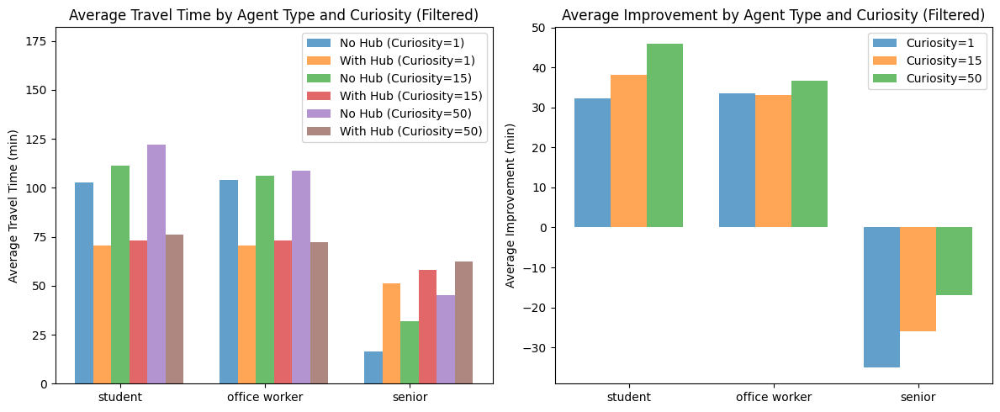

In [36]:
# Plot the average travel times for filtered results as earlier

avg_no_hub_filtered = []
avg_with_hub_filtered = []
avg_improvement_filtered = []

for curiosity in curiosity_factors:
    df = improvement_results_filtered[curiosity]
    avg_no_hub_filtered.append(df['Avg No Hub'].values)
    avg_with_hub_filtered.append(df['Avg With Hub'].values)
    avg_improvement_filtered.append(df['Avg Improvement'].values)

avg_no_hub_filtered = np.array(avg_no_hub_filtered)
avg_with_hub_filtered = np.array(avg_with_hub_filtered)
avg_improvement_filtered = np.array(avg_improvement_filtered)

x = np.arange(len(agent_types))
width = 0.25
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

for i, curiosity in enumerate(curiosity_factors):
    ax[0].bar(x + i*width, avg_no_hub_filtered[i], width/2, label=f'No Hub (Curiosity={curiosity})', alpha=0.7)
    ax[0].bar(x + i*width + width/2, avg_with_hub_filtered[i], width/2, label=f'With Hub (Curiosity={curiosity})', alpha=0.7)

ax[0].set_ylim(0, np.max(avg_no_hub_filtered) + 60)
ax[0].set_xticks(x + width)
ax[0].set_xticklabels(agent_types)
ax[0].set_ylabel('Average Travel Time (min)')
ax[0].set_title('Average Travel Time by Agent Type and Curiosity (Filtered)')
ax[0].legend()

for i, curiosity in enumerate(curiosity_factors):
    ax[1].bar(x + i*width, avg_improvement_filtered[i], width, label=f'Curiosity={curiosity}', alpha=0.7)

ax[1].set_xticks(x + width)
ax[1].set_xticklabels(agent_types)
ax[1].set_ylabel('Average Improvement (min)')
ax[1].set_title('Average Improvement by Agent Type and Curiosity (Filtered)')
ax[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
# To skip running the simulation again, load the saved results

curiosity_factors = [1, 15, 50]
agent_types = ['student', 'adult', 'senior']

loaded_results_baseline = {}
for curiosity in curiosity_factors:
    loaded_results_baseline[curiosity] = {}
    for agent_type in agent_types:
        loaded_results_baseline[curiosity][agent_type] = load_simulation_results(agent_type=agent_type)

loaded_results_extras = {}
for curiosity in curiosity_factors:
    loaded_results_extras[curiosity] = {}
    for agent_type in agent_types:
        loaded_results_extras[curiosity][agent_type] = load_simulation_results(agent_type=agent_type)

loaded_results_filtered = {}
for curiosity in curiosity_factors:
    loaded_results_filtered[curiosity] = {}
    for agent_type in agent_types:
        loaded_results_filtered[curiosity][agent_type] = load_simulation_results(agent_type=agent_type)

# Summarize the improvements for loaded results
print("\n=== Summary of Improvements for Loaded Baseline Results ===")
improvement_loaded_baseline = {}
for curiosity in curiosity_factors:
    print(f"\n=== Curiosity Factor: {curiosity} ===")
    improvement_loaded_baseline[curiosity] = summarize_improvements(loaded_results_baseline[curiosity])
    # Save to Excel file
    improvement_loaded_baseline[curiosity].to_excel(f"improvement_summary_loaded_baseline_curiosity_{curiosity}.xlsx", index=False)

print("\n=== Summary of Improvements for Loaded Results with Extras ===")
improvement_loaded_extras = {}
for curiosity in curiosity_factors:
    print(f"\n=== Curiosity Factor: {curiosity} ===")
    improvement_loaded_extras[curiosity] = summarize_improvements(loaded_results_extras[curiosity])
    # Save to Excel file
    improvement_loaded_extras[curiosity].to_excel(f"improvement_summary_loaded_extras_curiosity_{curiosity}.xlsx", index=False)

print("\n=== Summary of Improvements for Loaded Filtered Results ===")
improvement_loaded_filtered = {}
for curiosity in curiosity_factors:
    print(f"\n=== Curiosity Factor: {curiosity} ===")
    improvement_loaded_filtered[curiosity] = summarize_improvements(loaded_results_filtered[curiosity])
    # Save to Excel file
    improvement_loaded_filtered[curiosity].to_excel(f"improvement_summary_loaded_filtered_curiosity_{curiosity}.xlsx", index=False)

NameError: name 'curiosity_factors' is not defined